In [1]:
suppressPackageStartupMessages({
    library(Seurat)
    library(ggplot2)
    library(dplyr)
    library(ggthemes)
    library(uwot)
    library(pheatmap)
    library(harmony)
    library(tibble)
    library(tidyr)
    library(rlang)
    library(purrr)
    library(glue)
    source('typing_utils.r')
})

# Load data

In [2]:
amp.p2.counts.path <- "/data/srlab/fzhang/amp/results/2020_01_22_AMP_cite_seq_QC/mRNA_exprs_2020-01-24.rds"
amp.p2.meta.path <- "/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/fine_cluster_all_celltypes_82samples_2021-04-23.rds"
bcell.path <- "out_rds/_Bcell.rds"

In [3]:
# read in AMPp2 and xenium
xen <- readRDS(bcell.path)
sc <- readRDS(amp.p2.counts.path)
sc.meta <- readRDS(amp.p2.meta.path)

In [18]:
# filter AMPp2 to B cells only
sc.meta <- sc.meta %>%
  filter(cluster_name %in% c(
      'B-1: IgM+IgD+TCL1A+ naive',
      'B-3: CD24++CD27+IgM+ unswitched memory',
      'B-0: CD24+CD27+CD11b+ switched memory',
      'B-4: IgM+IgD+CD1c+ MZ-like',
      'B-8: AID+BCL6+ GC-like'))
names(sc.meta)[2] <- 'sid'
sc <- sc[, rownames(sc.meta)]

In [19]:
# filter AMPp2 to the same set of genes in the same order and convert to Seurat
common <- intersect(rownames(sc), rownames(xen))
sc <- CreateSeuratObject(sc[common, ],
                 meta.data = sc.meta,
                 project = 'AMPp2')
sc <- NormalizeData(sc, normalization.method = "LogNormalize", scale.factor = median(sc$nCount_RNA), verbose = F)

# Call B-cell subtypes

In [20]:
# load CCA weights (TODO: these should be computed here)
cca_res <- readRDS('../../lakshay/data/cache/20260108_bplasma_newHVGs_1767genes_29proteins_CCA_res.rds')
cca_weights <- cca_res$xcoef[, 1:20]

In [23]:
xen_b <- xen

## Merge and apply CCA


[1/7] Retrieving count matrices and checking gene overlap... 
  Xenium counts dimensions: 4008 genes x 30372 cells 
  Single-cell counts dimensions: 4004 genes x 19611 cells 
  Number of genes shared between objects: 4004 

[2/7] Preparing Seurat objects for merging... 
  Merged object created. 
  Merged object summary: 
An object of class Seurat 
4004 features across 49983 samples within 1 assay 
Active assay: RNA (4004 features, 0 variable features)
 2 layers present: counts.xen, counts.sc
  Merged object dimensions: 4004 genes x 49983 cells 
  Cells by modality: 

   sc   xen 
19611 30372 

[3/7] Choosing normalization scale factor... 
  Using median nCount_RNA from sc object only. 
  Xen median nCount_RNA: 253 
  SC median nCount_RNA: 606 
  Selected normalization scale factor: 606 

[4/7] Normalizing data, setting variable features, and scaling... 
  HVGs supplied: 4008 
  HVGs present in merged object: 4004 


Centering and scaling data matrix

Centering and scaling data from split sc

Centering and scaling data from split xen




[5/7] Running dimensional reduction... 
  cca_weights provided; constructing CCA-based reduction. 
  HVGs in scale.data: 4004 
  HVGs in cca_weights: 1767 
  HVGs used for CCA projection: 1767 
  Printing PCA diagnostic plots... 


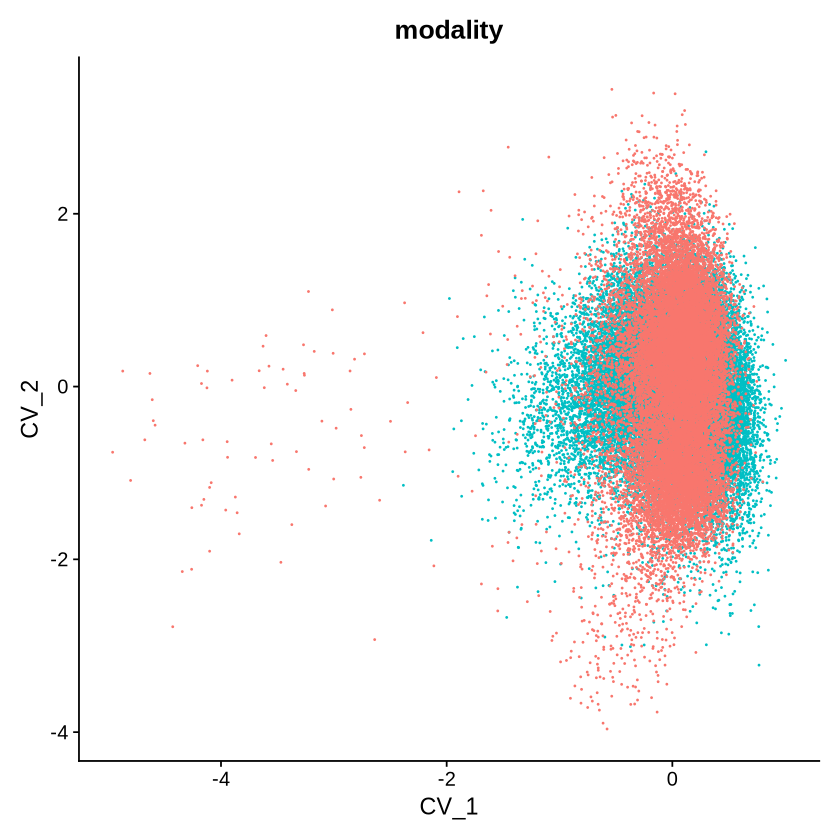


[6/7] Running Harmony... 


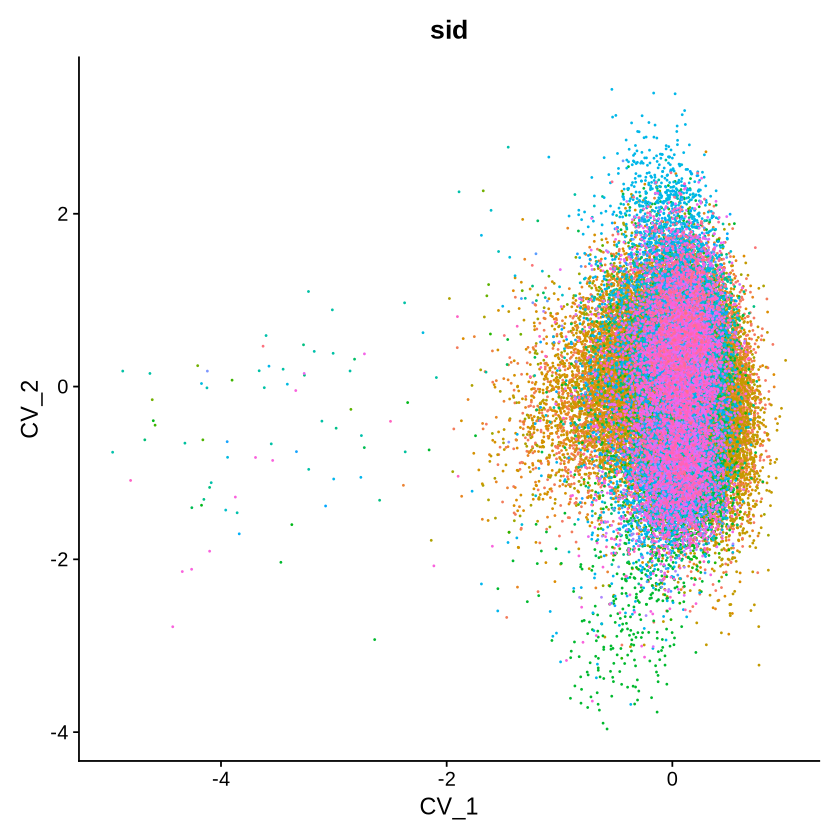

Transposing data matrix

Initializing state using k-means centroids initialization

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2499150)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2499150)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2499150)”
Warning message:
“did not converge in 25 iterations”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2499150)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2499150)”
Warning message:
“did not converge in 25 iterations”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2499150)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



  Printing Harmony diagnostic plots... 


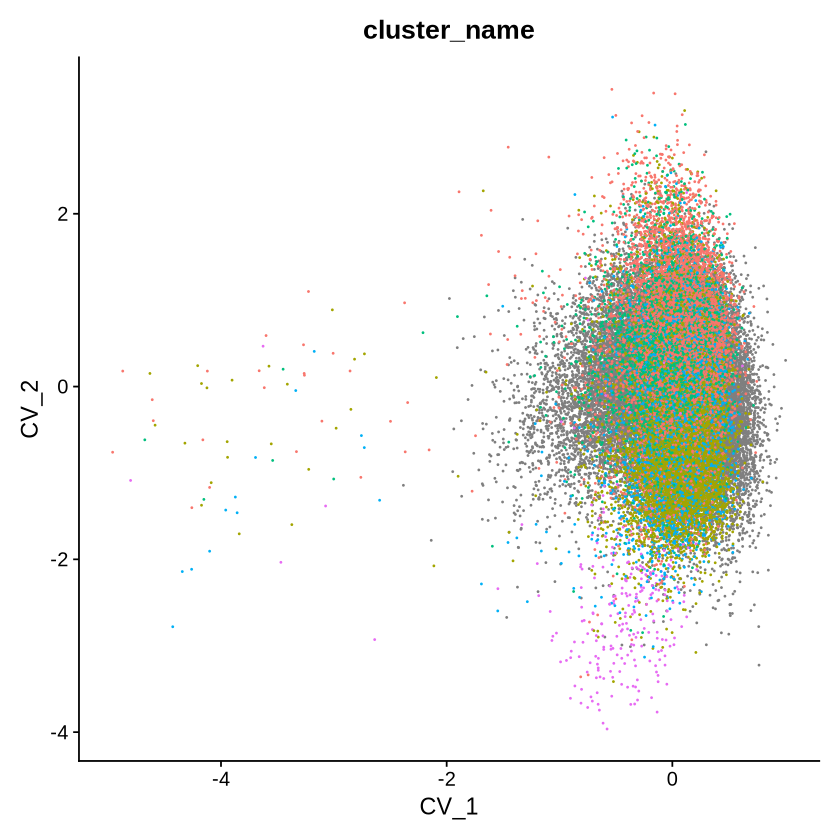

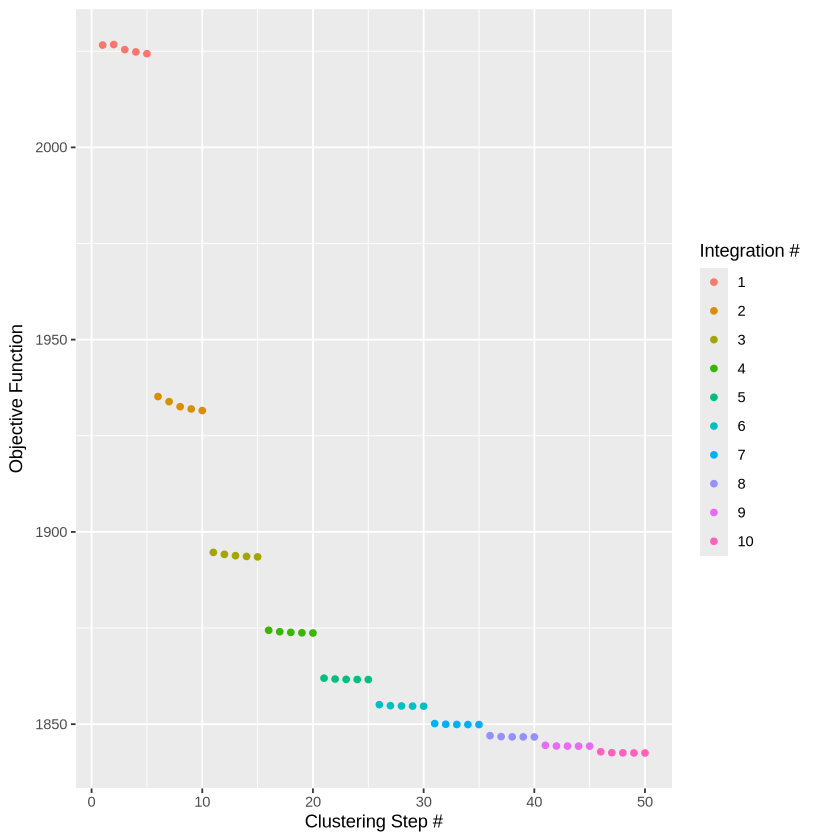

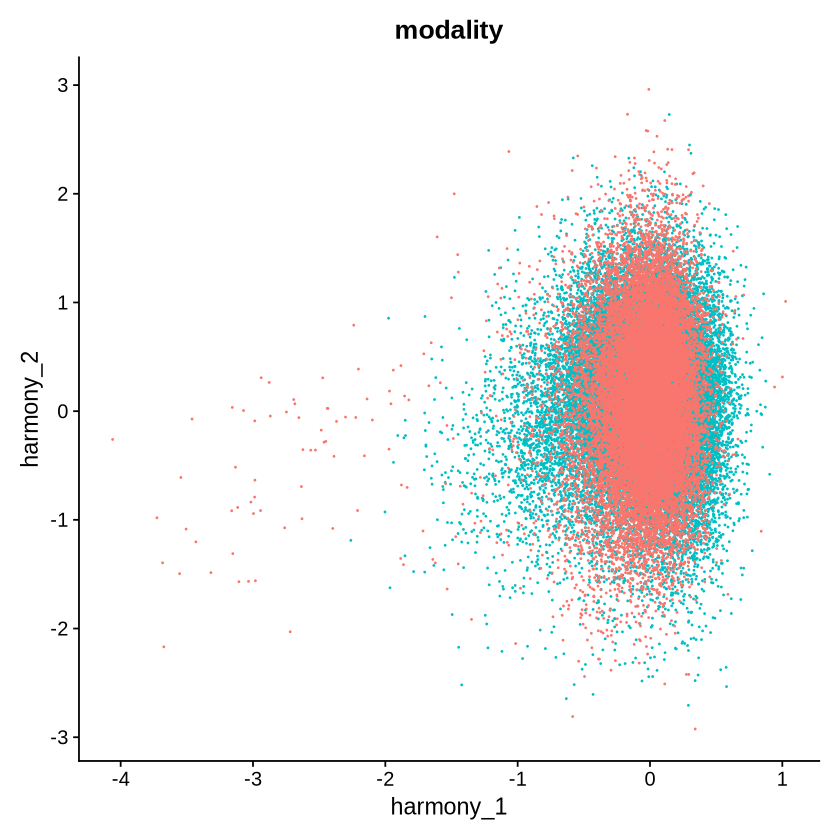


[7/7] Running UMAP on the Harmony reduction... 


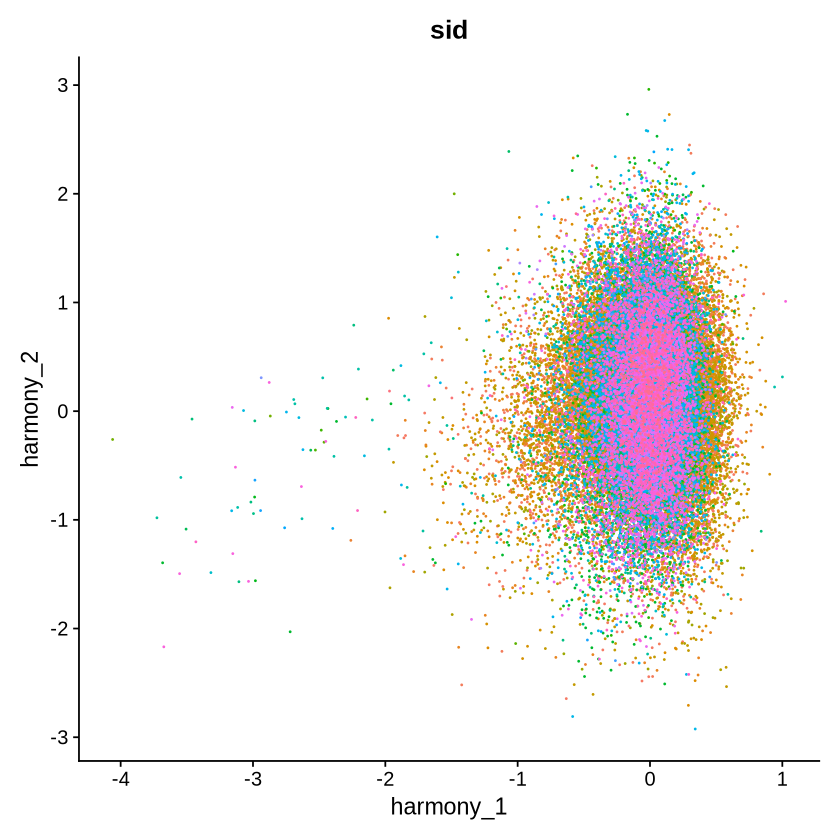

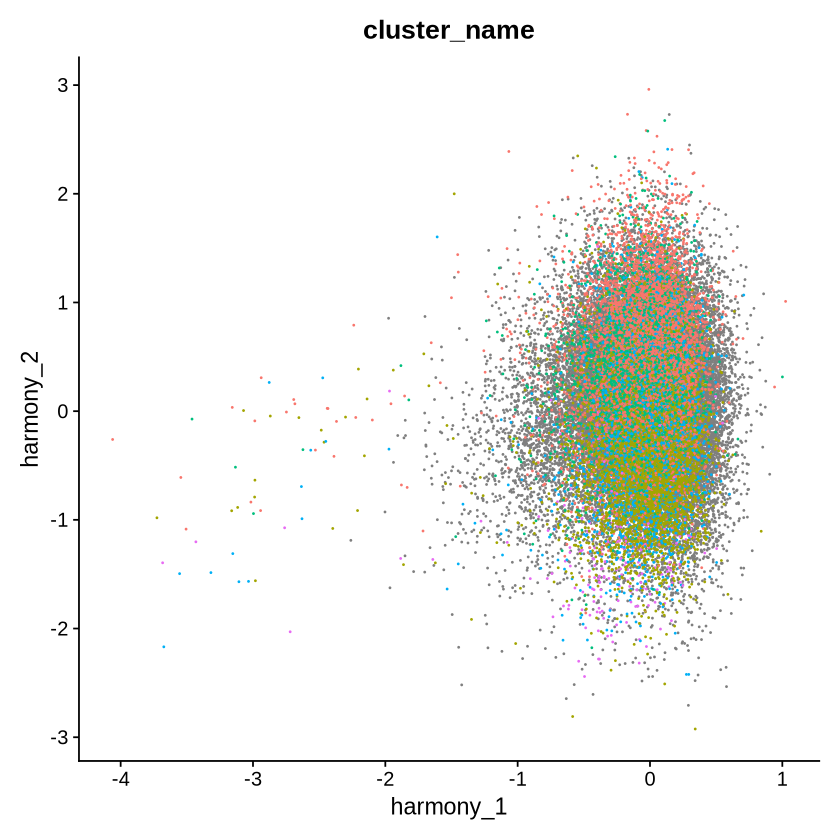

In [24]:
b_merged <- BuildIntegratedReference(
    xen = xen_b,
    sc = sc,
    normalization_target = "sc_median",
    hvgs = rownames(xen),
    cca_weights = cca_weights,
    annotation_var = "cluster_name"
)

## Label transfer


[1/4] Checking inputs... 
  Using annotation variable: cluster_name 
  Using n_neighbors = 50 and min_ratio = 1.1 

[2/4] Computing nearest-neighbor graph from Harmony embedding... 
  Graph computation complete. 

[3/4] Transferring labels from sc cells to xen cells... 
  Labels written to: cluster_name 
  Xen cells without transferred labels: 2787 

[4/4] Plotting unlabeled cells and final xen label map... 


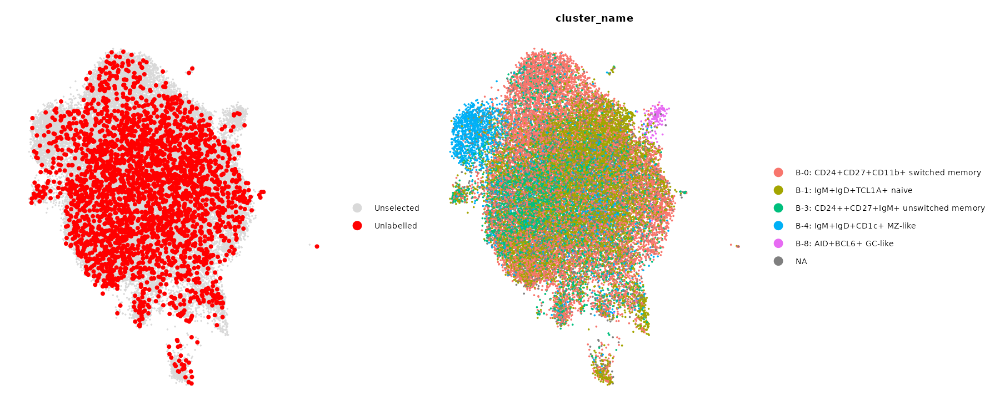

In [28]:
b_merged <- TransferLabelsGraph(
    merged = b_merged,
    annotation_var = "cluster_name",
    n_neighbors = 50,
    min_ratio = 1.1
)

## Examine marker genes

In [29]:
ShowClusterMarkers(b_merged[, b_merged$modality == "xen"], "cluster_name", n_show = 10)

Removing NA values from labels



row,B-0: CD24+CD27+CD11b+ switched memory,B-1: IgM+IgD+TCL1A+ naive,B-3: CD24++CD27+IgM+ unswitched memory,B-4: IgM+IgD+CD1c+ MZ-like,B-8: AID+BCL6+ GC-like
<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,CD27,CD22,CXCR4,CD1C,MS4A1
2,S100A10,HLA-DRB1,LTB,LTB,SUGCT
3,HLA-DQA1,IL4R,IKZF3,CD79B,MZB1
4,SCIMP,CD72,EEF1B2,MZB1,XBP1
5,S100A4,FCER2,CCDC50,MS4A1,EIF4A1
6,CD99,CD83,TCF4,CD79A,CD38
7,RGPD6,CD79B,TRAF5,PARP15,SDC1
8,FLNA,NCF1,CD79A,BANK1,XPO6
9,HSPA8,CD19,S100A4,FCRL3,SENP6


Removing NA values from labels



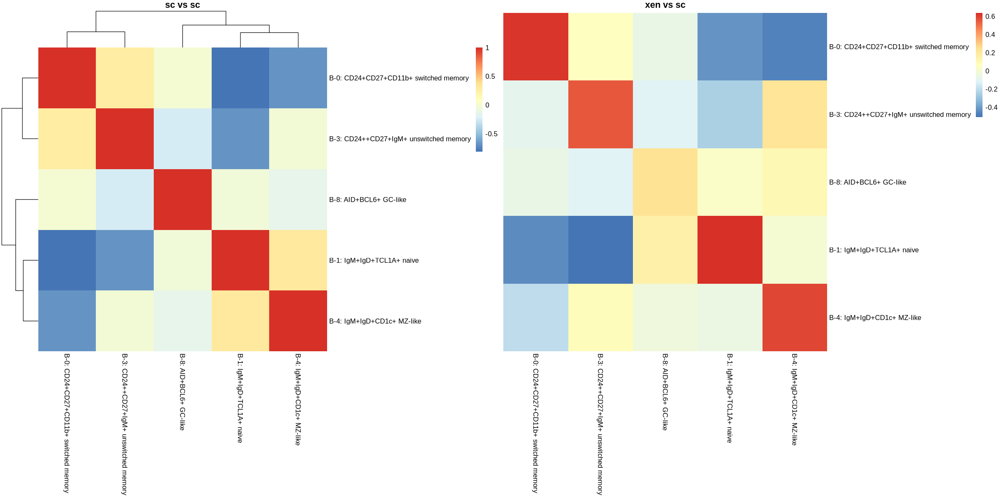

In [31]:
source('typing_utils.r')
res <- CompareMarkerCorrelations(b_merged[,b_merged$modality == "xen"],
                                 b_merged[,b_merged$modality == "sc"], "cluster_name", bicluster = T)

## Save

In [36]:
prep xen_b for saving
xen_b@meta.data <- subset(
  xen_b@meta.data,
  select = -c(humap_fgraph_res.0.8, seurat_clusters)
)

colnames(b_merged) <- sub("^xen_", "", colnames(b_merged))
xen_b$celltype.fine <- b_merged@meta.data[colnames(xen_b), "cluster_name"]
xen_b[[]]$celltype.fine[is.na(xen_b[[]]$celltype.fine)] <- "B-9: Untyped B cell"

In [37]:
xen_b[['cca']] <- b_merged[,colnames(xen_b)][['cca']]
xen_b[['harmony']] <- b_merged[,colnames(xen_b)][['harmony']]
xen_b <- Run_uwot_umap(xen_b, spread = 0.8, min_dist = 0.3)

In [38]:
saveRDS(xen_b, file = "out_rds/intermediate/_B_finetyped.rds")

## examine whether AMP clusters separate well in harmonized CCA space

In [255]:
tab <- table(t_merged$seurat_clusters, t_merged$cluster_name)
tab_norm <- prop.table(tab, margin = 1)

In [256]:
compute_or <- function(tab) {
  or_mat <- matrix(NA, nrow = nrow(tab), ncol = ncol(tab))
  rownames(or_mat) <- rownames(tab)
  colnames(or_mat) <- colnames(tab)

  total <- sum(tab)

  for (i in seq_len(nrow(tab))) {
    for (j in seq_len(ncol(tab))) {
      a <- tab[i, j]
      b <- sum(tab[i, ]) - a
      c <- sum(tab[, j]) - a
      d <- total - a - b - c

      or_mat[i, j] <- (a * d) / (b * c)
    }
  }

  or_mat
}

tab_or <- compute_or(tab)
tab_lor <- log2(tab_or)
tab_lor[tab_lor == -Inf] <- -4
tab_lor[tab_lor == Inf] <- 4

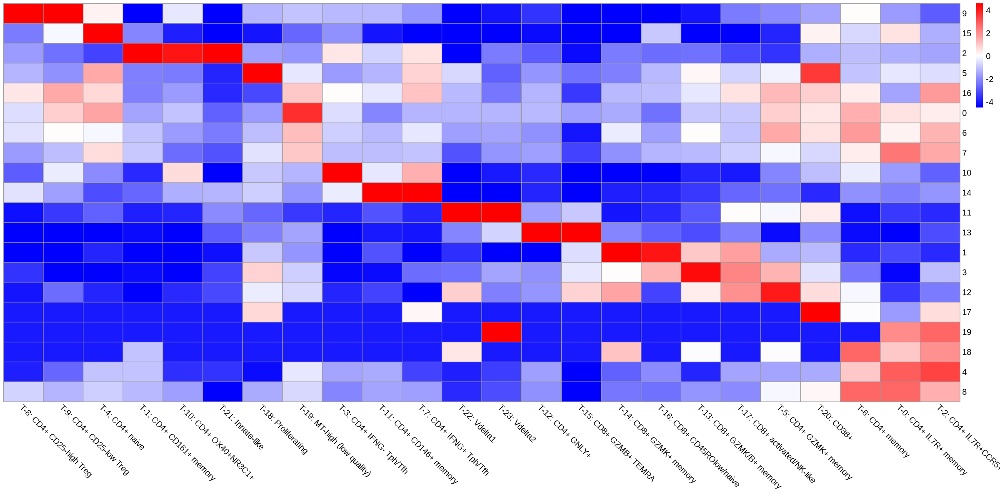

In [257]:
# visualize with sorted rows and columns
clust_result <- pheatmap::pheatmap(tab_lor, cluster_rows = TRUE, cluster_cols = FALSE, silent = TRUE)
row_order <- clust_result$tree_row$order
clustered_data <- tab_lor[row_order, ]
max_indices <- apply(clustered_data, 2, which.max)
col_order <- order(max_indices)
clustered_sorted_data <- clustered_data[, col_order]

fig.size(10, 20)
pheatmap::pheatmap(
    clustered_sorted_data, 
    cluster_rows = FALSE,
    cluster_cols = FALSE,
    angle_col = "315", 
    fontsize = 12,
    color = colorRampPalette(c("blue","white","red"))(100), 
    breaks = seq(-4.5, 4.6, length.out = 101)
)

In [285]:
xen_t[[]]

,orig.ident,nCount_RNA,nFeature_RNA,sid,x,y,avg_assignment_confidence,celltypes.coarse,celltypes.med
,<fct>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
CR4fdfc2269-1483_8073578341-02-02,EDP1,213,167,8073578341-02-02,530.4683,17115.29,0.9042,T.NKcell,T
CR4fdfc2269-1697_8073578341-02-02,EDP1,118,69,8073578341-02-02,468.5102,17221.09,0.9719,T.NKcell,T
CR4fdfc2269-2201_8073578341-02-02,EDP1,249,186,8073578341-02-02,1037.9795,16724.68,0.9304,T.NKcell,T
CR4fdfc2269-2300_8073578341-02-02,EDP1,185,141,8073578341-02-02,1354.5845,16417.97,0.8699,T.NKcell,T
CR4fdfc2269-2312_8073578341-02-02,EDP1,190,159,8073578341-02-02,1026.0824,16750.71,0.9121,T.NKcell,T
CR4fdfc2269-2323_8073578341-02-02,EDP1,105,88,8073578341-02-02,1357.9987,16419.78,0.8693,T.NKcell,T
CR4fdfc2269-2324_8073578341-02-02,EDP1,133,101,8073578341-02-02,1349.8462,16428.15,0.9080,T.NKcell,T
CR4fdfc2269-2352_8073578341-02-02,EDP1,127,98,8073578341-02-02,1354.3381,16423.79,0.8850,T.NKcell,T
CR4fdfc2269-2365_8073578341-02-02,EDP1,103,85,8073578341-02-02,1362.1288,16417.35,0.8798,T.NKcell,T


## load lib

In [ ]:
source("../R/utils.R")
suppressPackageStartupMessages({
    library(Seurat)
    library(pheatmap)
    library(RColorBrewer) 
    library(stringr)
    library(RANN)
    })

In [ ]:
start_upR()

In [ ]:
options(repr.matrix.max.cols = 100, repr.matrix.max.rows = 100)

## read in data and create Seurat objects 

In [ ]:
sc <- readRDS("/data/srlab/fzhang/amp/results/2020_01_22_AMP_cite_seq_QC/mRNA_exprs_2020-01-24.rds")
meta_sc <- readRDS("/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/fine_cluster_all_celltypes_82samples_2021-04-23.rds")
meta_sc_t <- meta_sc[meta_sc$cell_type == 'T cell', ]
names(meta_sc_t)[2] <- 'sid'
sc <- sc[, colnames(sc) %in% meta_sc_t$cell]

In [ ]:
# Genes as named in spatial panel 
genes_query<-readLines('../../yakir/2.cells_allsamples_LS/spatial_genes.txt')

# Converting gene names from Xenium to AMPp2 
gene_aliases <- list(
  "ATPSCKMT" = "FAM173B", "CCN1" = "CYR61", "CCN2" = "CTGF", "CCN3" = "NOV", "CCN4" = "WISP1", "CCN5" = "WISP2",
  "DLEU1" = "DLEU1-AS1", "ECRG4" = "C2orf40", "EEF1AKNMT" = "METTL13", "ITPRID2" = "SSFA2", "LRATD2" = "FAM84B",
  "MRTFA" = "MKL1", "MRTFB" = "MKL2", "MTRES1" = "C6orf203", "NIBAN1" = "FAM129A", "NOTCH2NLA" = "NOTCH2NL",
  "PACC1" = "TMEM206", "POGLUT2" = "KDELC1", "PRXL2A" = "FAM213A", "PWWP3A" = "MUM1", "RO60" = "TROVE2",
  "SEPTIN5" = "SEPT5", "SEPTIN6" = "SEPT6", "SEPTIN9" = "SEPT9", "SHFL" = "C19orf66", "SOX2-OT" = "SOX2",
  "TAFA5" = "FAM19A5", "TASOR" = "FAM208A", "TASOR2" = "FAM208B"
)

for (gene in genes_query) {
    if (gene %in% names(gene_aliases)) {
        genes_query[which(genes_query == gene)] = gene_aliases[gene]
    }
}

In [6]:
sc <- sc[match(genes_query, rownames(sc)), ]

In [7]:
# HVGs in T cells calculated from spatial genes only 
# HVPs in T cells calculated using T cell states described in AMPp2 

cca_res <- readRDS('../data/cache//tonly_1889genes_28proteins_CCA_res.rds')
sc <- sc[, match(rownames(cca_res$scores$xscores), colnames(sc))]
meta_sc_t <- meta_sc_t %>% filter(rownames(.) %in% rownames(cca_res$scores$xscores))

In [8]:
sc.seurat <- CreateSeuratObject(sc, 
                         meta.data = meta_sc_t, 
                         project = 'AMPp2')
sc.seurat$orig.ident = 'ampp2'

ampp2_cca <- cca_res$scores$xscores
colnames(ampp2_cca) <- paste0("CV_", seq_len(ncol(ampp2_cca)))

cca_dr <- CreateDimReducObject(
  embeddings = ampp2_cca,
  key = "CV_",
  assay = DefaultAssay(sc.seurat)
)

sc.seurat[['cca']] <- cca_dr 

In [9]:
xenium <- Matrix::readMM('../all_cell_qc70tx50g.mtx')
xenium <- t(xenium)
meta_xenium <- read.csv('../all_cell_qc70tx50g_cellmeta.csv')
rownames(xenium) <- genes_query
colnames(xenium) <- meta_xenium$cell

In [10]:
meta_xenium_t <- meta_xenium[meta_xenium$cell_type == 'T cell', ]
xenium <- xenium[match(rownames(cca_res$xcoef), rownames(xenium)), colnames(xenium) %in% meta_xenium_t$cell]

In [11]:
xenium.seurat <- CreateSeuratObject(xenium, 
                             meta.data = meta_xenium_t, 
                             project = 'xenium')
xenium.seurat$orig.ident = 'xenium'

Warning message:
“Data is of class dgTMatrix. Coercing to dgCMatrix.”


In [12]:
xenium.seurat

An object of class Seurat 
1889 features across 101721 samples within 1 assay 
Active assay: RNA (1889 features, 0 variable features)
 1 layer present: counts

In [16]:
merged <- merge(xenium.seurat, sc.seurat)

**I've decided not to do variable gene selection from single-cell. The genes in the CCA embedding were already selected as highly variable per sample from the spatial gene set, so I'm just going to QC spatial cells based on expression of these 1889 genes.** 

## qc spatial cells based on expression of single-cell genes 

In [13]:
expmat <- xenium 
zeromat <- rowSums(expmat > 0)
as.data.frame(as.matrix(zeromat)) %>% head()

,V1
,<int>
CCL3,2732
IL10,238
GNLY,7181
IL13,157
ASPM,1581
STMN1,4775


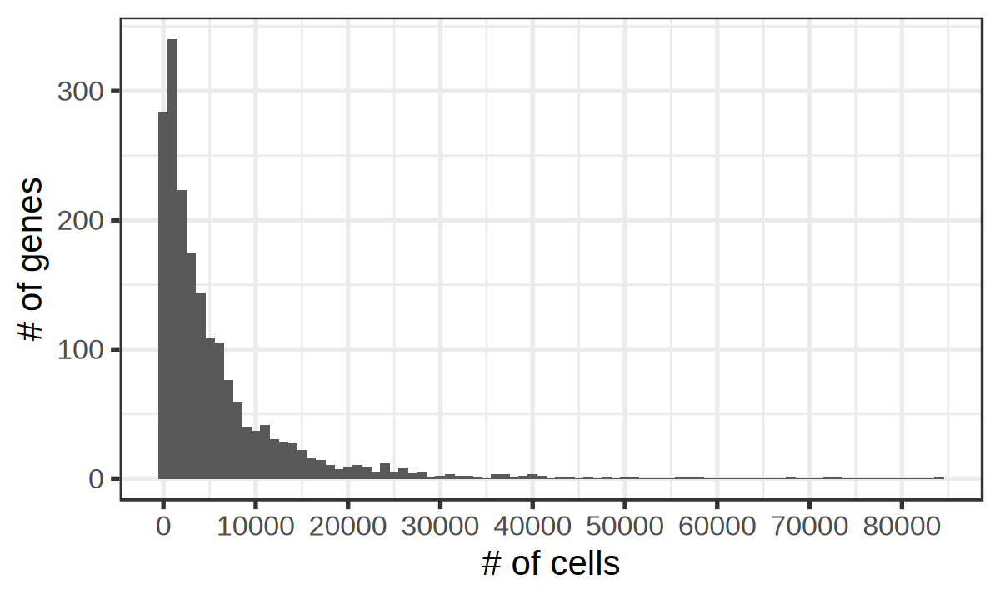

In [14]:
# Number of cells expressing a particular # of genes 
# Point of this figure is that most genes are only expressed by a small fraction of cells 

fig.size(6, 10)
as.data.frame(as.matrix(zeromat)) %>% 
    ggplot(aes(V1)) + 
    geom_histogram(binwidth = 1000) + 
    labs(x = '# of cells', 
         y = '# of genes') + 
scale_x_continuous(breaks=seq(0, 130000, 10000))

In [15]:
nGene <- colSums(expmat>0)
nCount <- colSums(expmat)

#### side quest: comparing read counts in single cell and spatial data

In [118]:
sc_full <- readRDS("/data/srlab/fzhang/amp/results/2020_01_22_AMP_cite_seq_QC/mRNA_exprs_2020-01-24.rds")
meta_sc <- readRDS("/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/fine_cluster_all_celltypes_82samples_2021-04-23.rds")
meta_sc_t <- meta_sc[meta_sc$cell_type == 'T cell', ]
names(meta_sc_t)[2] <- 'sid'
sc_full <- sc_full[, colnames(sc_full) %in% meta_sc_t$cell]

In [156]:
cow <- data.frame(cell = names(nGene), 
                  nGene = unname(nGene),
                  nCount = unname(nCount), 
                  Technology = 'Xenium')

cow <- cow %>% rbind(data.frame(cell = colnames(sc_full), 
                                nGene = colSums(sc_full > 0), 
                                nCount = colSums(sc_full), 
                                Technology = 'scRNAseq'))

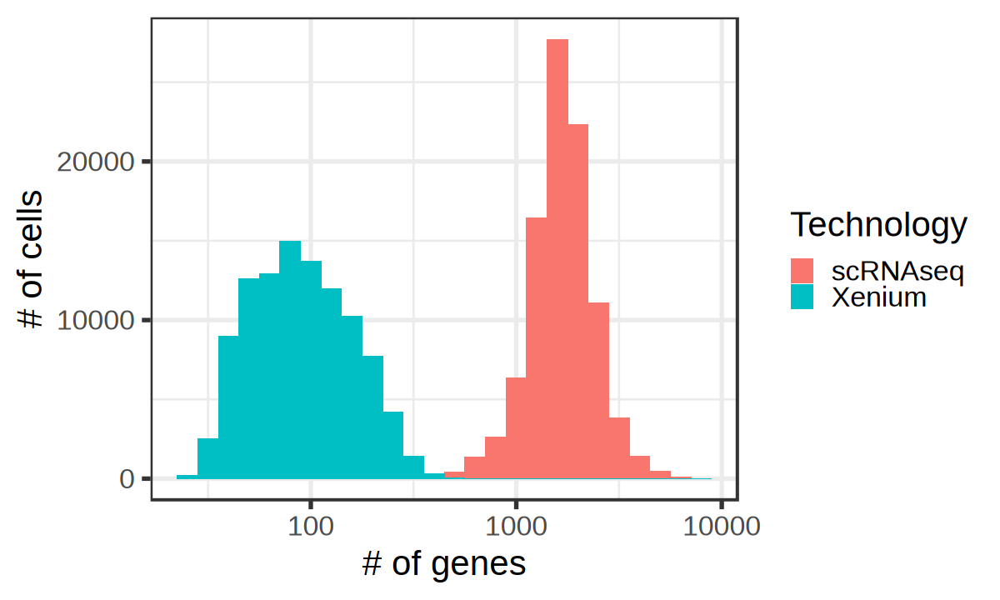

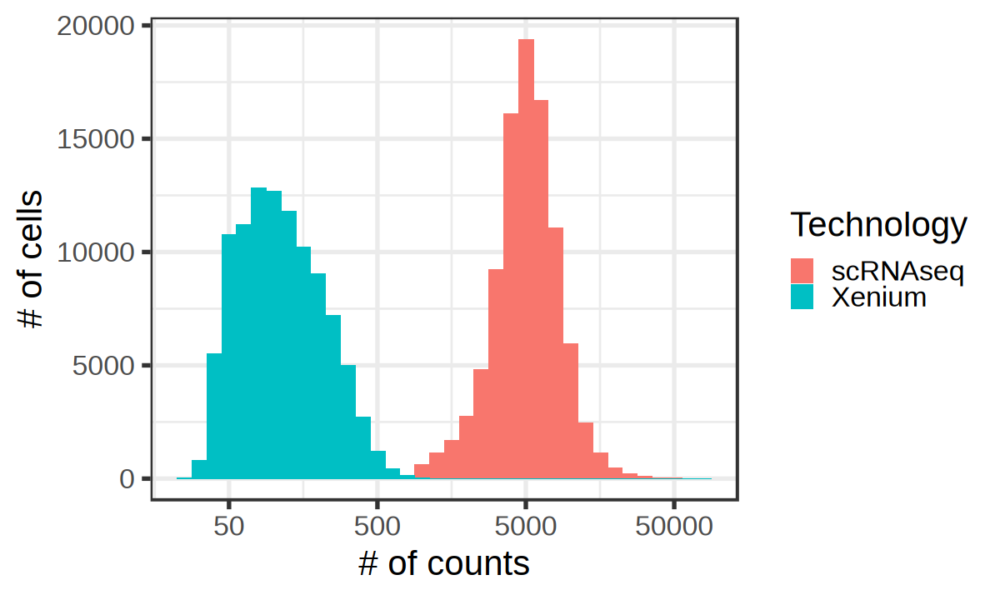

In [158]:
fig.size(6, 10)
ggplot(cow, aes(x = log10(nGene), fill = Technology)) +
  geom_histogram(position = "identity", binwidth = 0.1) +
  scale_x_continuous(
    name = "# of genes",
    breaks = log10(c(10, 100, 1000, 10000)),
    labels = c(10, 100, 1000, 10000)
  ) +
  labs(y = "# of cells")

ggplot(cow, aes(x = log10(nCount), fill = Technology)) +
  geom_histogram(position = "identity", binwidth = 0.1) +
  scale_x_continuous(
    name = "# of counts",
    breaks = log10(c(50, 500, 5000, 50000)),
    labels = c(50, 500, 5000, 50000)
  ) +
  labs(y = "# of cells")

#### back to QC 

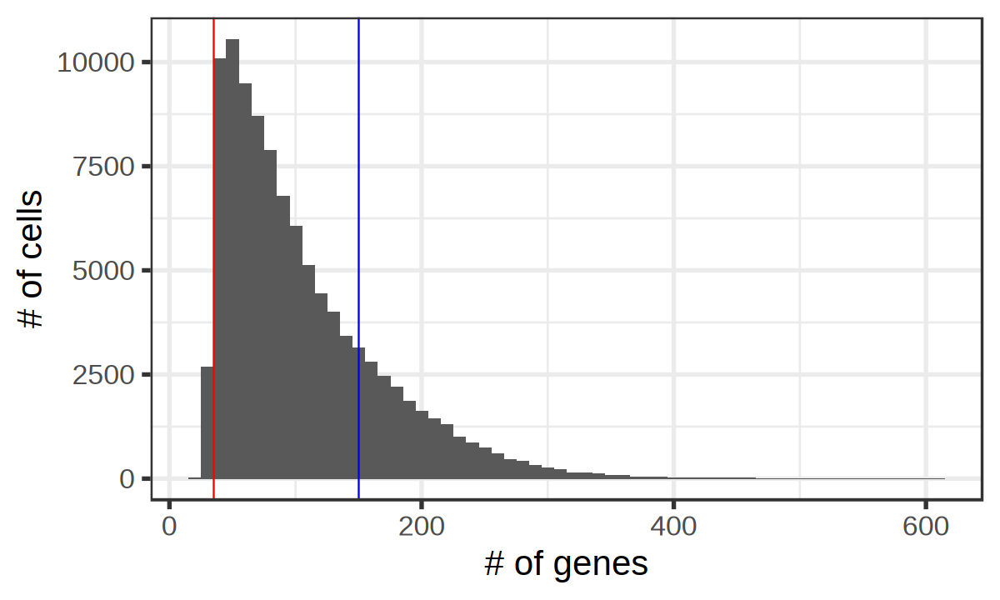

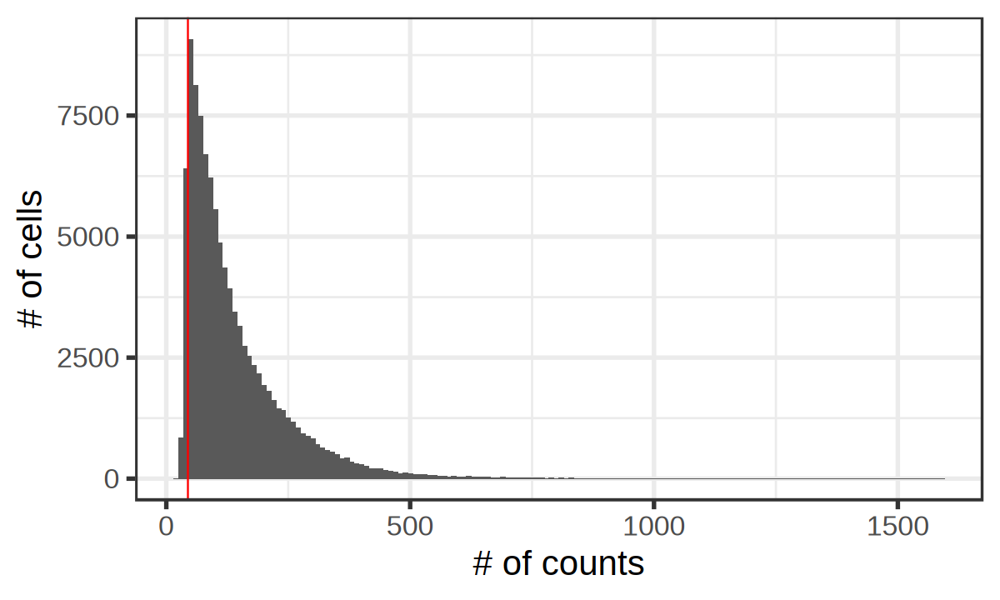

In [17]:
fig.size(6, 10)
gp <- as.data.frame(as.matrix(nGene)) %>% 
    ggplot(aes(V1)) + 
        geom_histogram(binwidth = 10) + 
        geom_vline(xintercept = 35, col = 'red') + 
        geom_vline(xintercept = 150, col = 'blue') + 
        labs(x = '# of genes', 
             y = '# of cells') 

cp <- as.data.frame(as.matrix(nCount)) %>% 
    ggplot(aes(V1)) + 
    geom_histogram(binwidth = 10) + 
    geom_vline(xintercept = 45, col = 'red') + 
    labs(x = '# of counts', 
         y = '# of cells') 

gp
cp

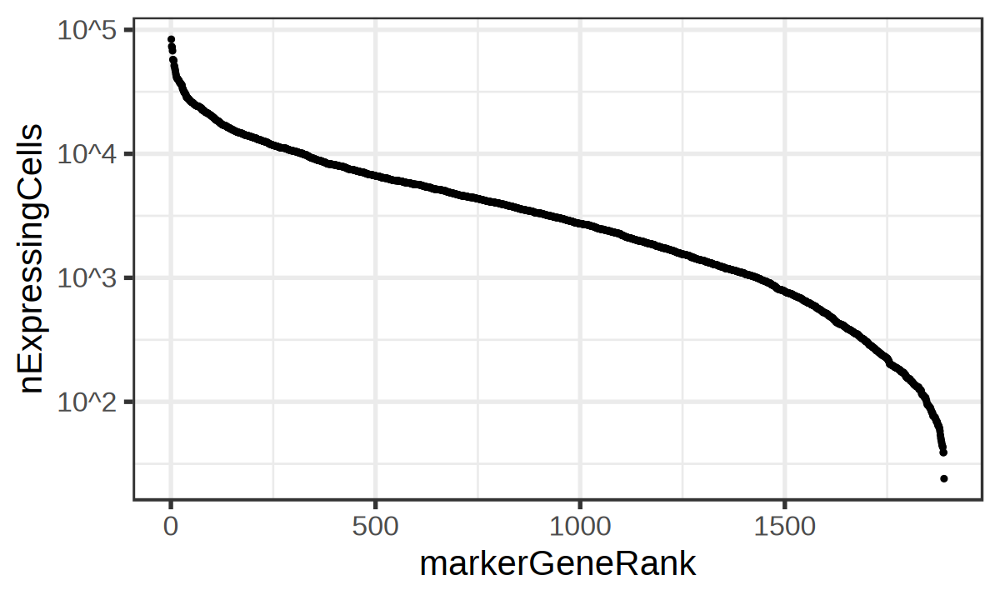

In [18]:
p <- as.data.frame(as.matrix(zeromat)) %>% 
    arrange(desc(V1)) %>% 
    mutate(rn = seq(1, length(zeromat))) %>% 
    ggplot() + 
        geom_point(aes(x=rn, y=log10(V1))) + 
        ylab("nExpressingCells") + 
        xlab("markerGeneRank") + 
        scale_y_continuous(labels = c('10', '10^2', '10^3', '10^4', '10^5'))

p

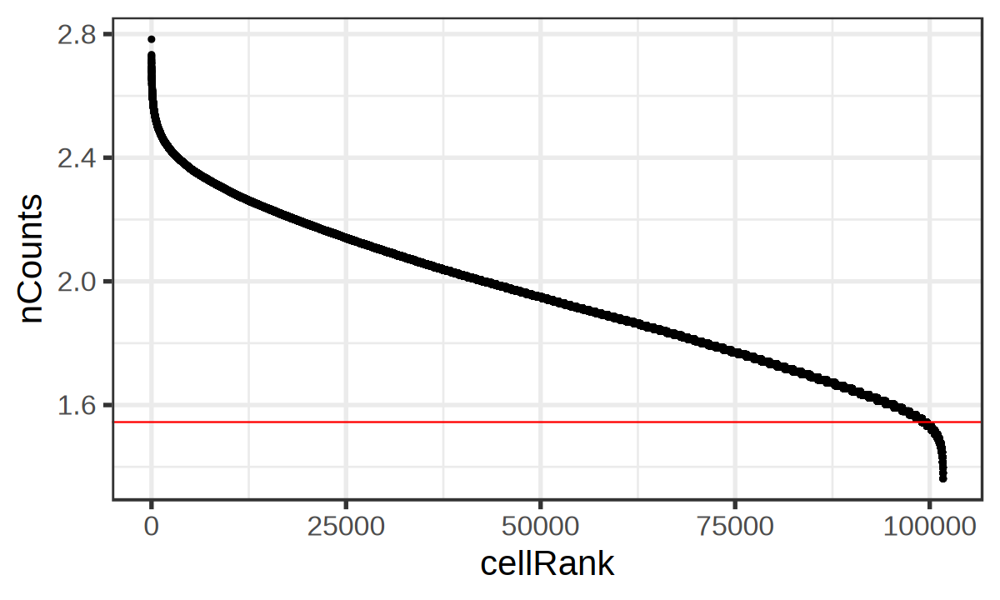

In [19]:
p <- as.data.frame(as.matrix(nGene)) %>% 
    arrange(desc(V1)) %>% 
    mutate(rn = seq(1, length(nGene))) %>% 
    ggplot() + 
        geom_point(aes(x=rn, y=log10(V1))) + 
        geom_hline(yintercept = log10(35), col = 'red') + 
        ylab("nCounts") + 
        xlab("cellRank") #+ #scale_y_continuous(labels = c('10', '10^2', '10^3', '10^4', '10^5'))

p

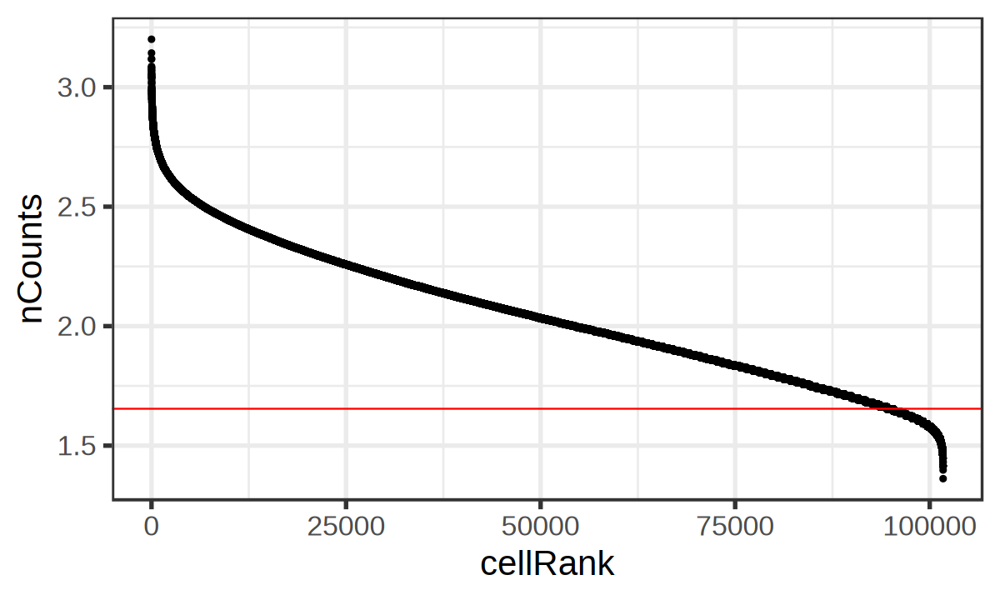

In [20]:
p <- as.data.frame(as.matrix(nCount)) %>% 
    arrange(desc(V1)) %>% 
    mutate(rn = seq(1, length(nCount))) %>% 
    ggplot() + 
        geom_point(aes(x=rn, y=log10(V1))) + 
        geom_hline(yintercept = log10(45), col = 'red') + 
        ylab("nCounts") + 
        xlab("cellRank") #+ #scale_y_continuous(labels = c('10', '10^2', '10^3', '10^4', '10^5'))

p

In [21]:
# Filtering out ~7% of Xenium cells 

ngene.thr = 35
ncounts.thr = 45

In [22]:
head(as.data.frame(as.matrix(nGene)))

,V1
,<int>
CR9384ce767-38,75
CR9384ce767-42,50
CR9384ce767-81,165
CR9384ce767-103,80
CR9384ce767-142,102
CR9384ce767-319,75


In [23]:
exclude <- unique(c(names(nGene)[nGene < ngene.thr], names(nCount)[nCount < ncounts.thr]))
merged <- subset(merged, cells = exclude, invert = T)

### normalization 

In [24]:
#median.count <- mean(median(merged$nCount_RNA[merged$orig.ident == "xenium"]), 
#                     median(merged$nCount_RNA[merged$orig.ident == "ampp2"]))

# CCA was computed with this normalization so all cells will be normalized to this constant before projection into CCA space
median.count = median(sc.seurat$nCount_RNA)
median.count

[1] 645

#### negative control: does PCA-based embedding have enough useful information to type cells? 

In [12]:
sc_norm <- sc %>% 
    singlecellmethods::normalizeData(scaling_factor = median.count) 

# Only subsetting after as normalizeData requires full library size for accurate normalization 
sc_norm <- sc_norm[match(row.names(cca_res$xcoef), rownames(sc_norm)), ]

sc.seurat[['RNA']] <- SetAssayData(
    sc.seurat[['RNA']], 
    layer = 'data', 
    new.data = sc_norm
)


sc_norm <- sc_norm %>% 
    singlecellmethods::scaleData() %>% 
    scale(center = TRUE, scale = FALSE) 

sc.seurat[['RNA']] <- SetAssayData(
    sc.seurat[['RNA']], 
    layer = 'scale.data', 
    new.data = sc_norm
)



In [13]:
VariableFeatures(sc.seurat) <- rownames(cca_res$xcoef)

In [16]:
set.seed(1)
sc.seurat <- RunPCA(sc.seurat, verbose = T)

PC_ 1 
Positive:  LTB, IL7R, SOCS3, EEF1B2, MAL, CCR7, TCF7, SELL, CD55, AREG 
	   LEF1, TMEM123, SLC2A3, STAT3, SNHG8, AP3M2, IRS2, IL6ST, KLF2, SOCS1 
	   ZBTB10, SESN3, TNFRSF25, LEPROTL1, SATB1, CD40LG, CMTM8, DNAJA1, FOXP1, IL6R 
Negative:  NKG7, GZMA, CST7, GZMH, GZMB, CD8A, HLA-DRB1, APOBEC3G, PRF1, GZMK 
	   TRGC2, KLRD1, KLRG1, CTSC, CD8B, XCL2, HLA-DQA1, SLAMF7, EOMES, CYBA 
	   ZEB2, ITGB2, GNLY, FGFBP2, CRTAM, APOBEC3C, PTGDR, ABI3, MYO1F, CCL3 
PC_ 2 
Positive:  KLF2, CD69, NR4A2, DNAJA1, H3F3B, HSPA8, NKG7, CXCR4, CD55, IRF1 
	   FGFBP2, NR4A1, SRSF2, EEF1B2, KLRD1, DDIT3, AREG, DDX3X, IFRD1, EIF4A3 
	   CD8A, CYCS, HEXIM1, KDM6B, SNHG8, CD8B, TNFSF9, H2AFX, VPS37B, ETV3 
Negative:  TNFRSF18, CTLA4, PDCD1, CD4, MAF, ICA1, TOX2, FKBP5, CORO1B, RBPJ 
	   LAIR2, PKM, NMB, ENTPD1, LAG3, PTPN13, CD2, CD200, NR3C1, BATF 
	   TYMP, F5, PHEX, TIGIT, ITM2A, CD7, CCDC50, IL6R, FZD3, CD82 
PC_ 3 
Positive:  LDHA, H3F3B, DNAJA1, HSPA8, RAN, SNRPB, STMN1, ITM2A, NR4A2, PARK7 
	   SOD1

Transposing data matrix

Initializing state using k-means centroids initialization

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”


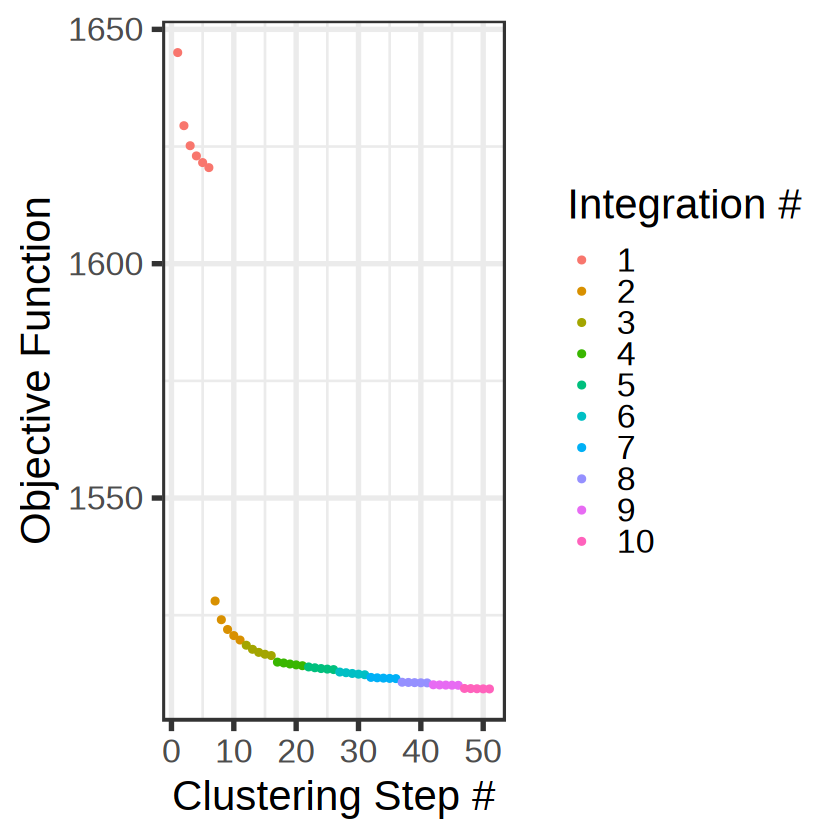

In [20]:
set.seed(1)
plan(multisession, workers=35)
sc.seurat <- harmony::RunHarmony(sc.seurat, c("sid"), plot_convergence = TRUE, max_iter = 10, reduction.use = "pca", reduction.save = "harmony_on_pca", 
                 early_stop = F)

In [26]:
cca_proj <- t(LayerData(sc.seurat[['RNA']], layer = 'scale.data')) %*% cca_res$xcoef[, 1:20]
colnames(cca_proj) <- paste0("CV_", seq(1, dim(cca_proj)[2]))

In [28]:
sc.seurat[['cca_embedding']] <- Seurat::CreateDimReducObject(
    embeddings = cca_proj, 
    loadings = cca_res$xcoef[, 1:20], 
    stdev = as.numeric(apply(cca_proj, 2, stats::sd)), 
    assay = "RNA", 
    key = "CV_"
    )

Warning message:
“Key ‘CV_’ taken, using ‘ccaembedding_’ instead”


Transposing data matrix

Initializing state using k-means centroids initialization

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 4684350)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



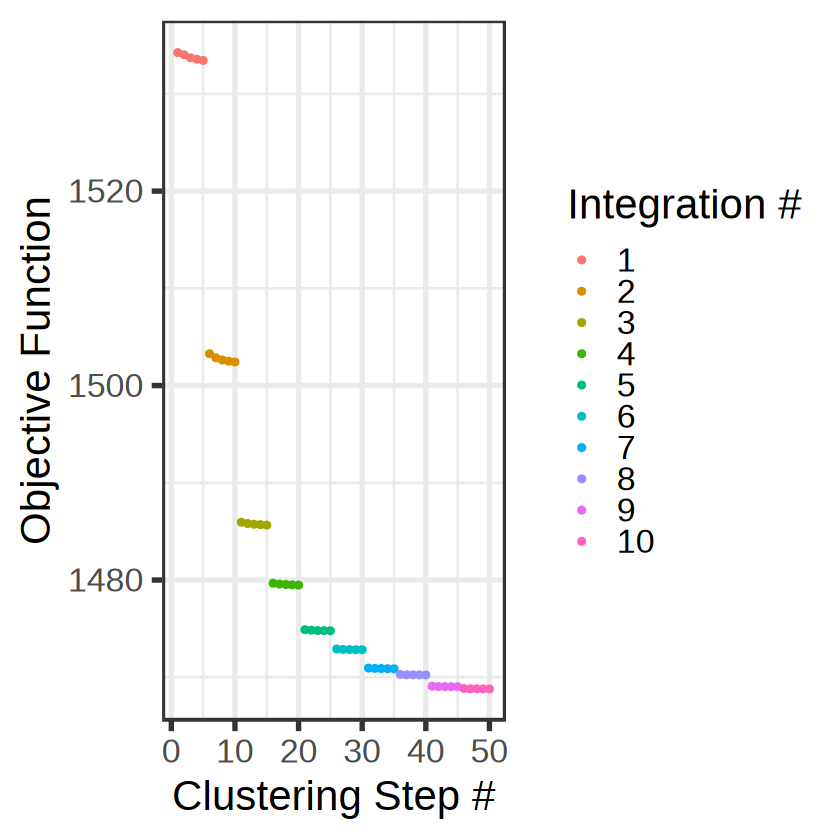

In [29]:
sc.seurat <- harmony::RunHarmony(sc.seurat, c("sid"), plot_convergence = TRUE, max_iter = 10, reduction.use = "cca_embedding", reduction.save = "harmony_on_cca", 
                 early_stop = F)

In [30]:
Run_uwot_umap <- function(SeuratObj, embedding, min_dist = 0.3, spread = 0.8){
    HU <- uwot::umap(SeuratObj@reductions[[embedding]]@cell.embeddings, min_dist = min_dist, 
                 spread = spread, ret_extra = 'fgraph', fast_sgd = FALSE)
    colnames(HU$embedding) = c('HUMAP1', 'HUMAP2')
    rownames(HU$fgraph) = colnames(HU$fgraph) = Cells(SeuratObj)
    SeuratObj[['humap']] <- Seurat::CreateDimReducObject(
        embeddings = HU$embedding,
        assay = 'RNA',
        key = 'HUMAP_',
        global = TRUE
    )
    HU_graph <- Seurat::as.Graph(HU$fgraph)
    DefaultAssay(HU_graph) <- DefaultAssay(SeuratObj)
    SeuratObj[['humap_fgraph']] <- HU_graph
    return(SeuratObj)
    }

sc.seurat.pca <- Run_uwot_umap(sc.seurat, 'harmony_on_pca')
sc.seurat.cca <- Run_uwot_umap(sc.seurat, 'harmony_on_cca')

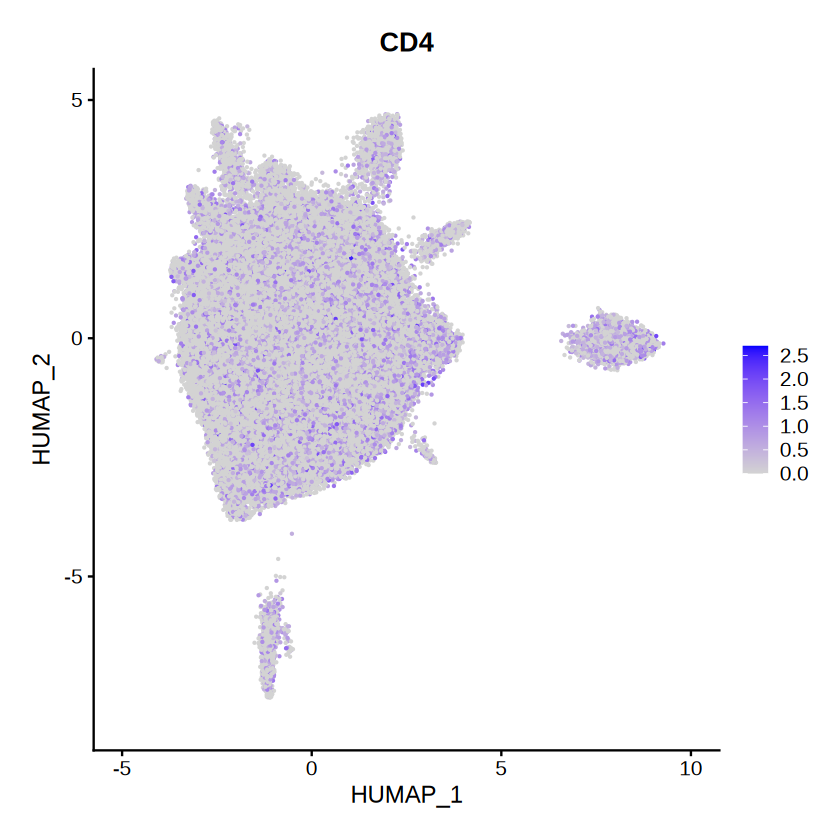

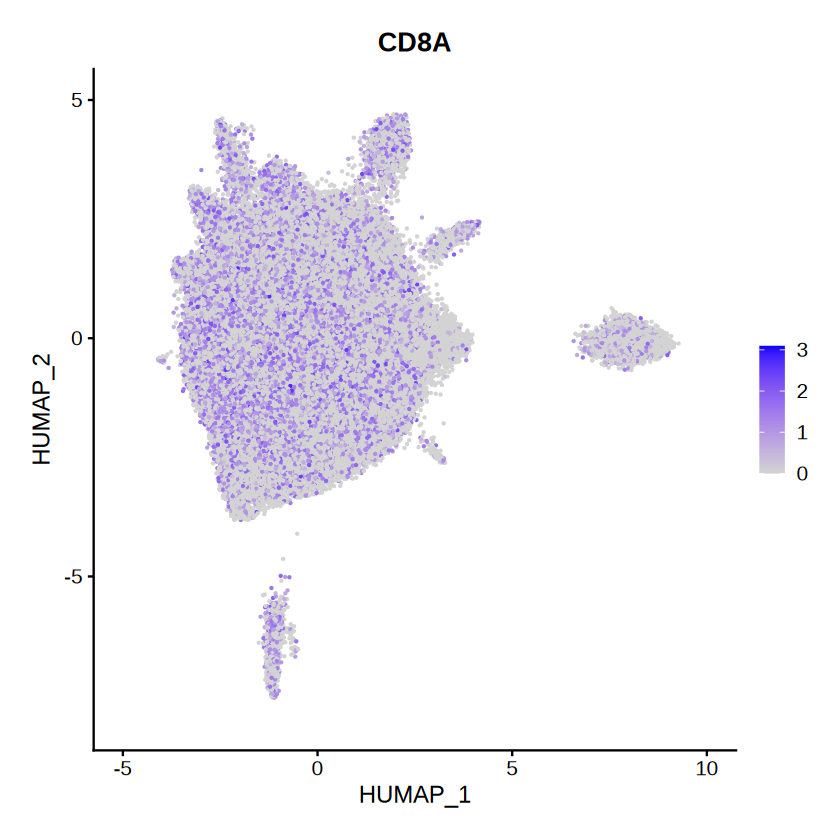

In [34]:
FeaturePlot(sc.seurat.cca, features = 'CD4')
FeaturePlot(sc.seurat.cca, features = 'CD8A')

#### back to normalization 

In [25]:
sc_norm <- sc %>% 
    singlecellmethods::normalizeData(scaling_factor = median.count) 

# Only subsetting after as normalizeData requires full library size for accurate normalization 
sc_norm <- sc_norm[match(row.names(cca_res$xcoef), rownames(sc_norm)), ]

xenium_norm <- xenium[, which(!(colnames(xenium) %in% exclude))] %>% 
    singlecellmethods::normalizeData(scaling_factor = median.count) 

merged[['RNA']] <- SetAssayData(
    merged[['RNA']], 
    layer = 'data', 
    new.data = cbind(sc_norm, xenium_norm)
)

# Double-scaling below because scaleData caps scaled values at 10, leading to matrix that isn't truly centered 
# CCA::comput rescales input before multiplying into xcoef, so I need to do that too 

sc_norm <- sc_norm %>% 
    singlecellmethods::scaleData() %>% 
    t %>% 
    scale(center = TRUE, scale = FALSE) 

xenium_norm <- xenium_norm %>% 
    singlecellmethods::scaleData() %>% 
    t %>% 
    scale(center = TRUE, scale = FALSE) 

merged[['RNA']] <- SetAssayData(
    merged[['RNA']], 
    layer = 'scale.data', 
    new.data = cbind(t(sc_norm), t(xenium_norm))
)

'as(<dgTMatrix>, "dgCMatrix")' is deprecated.
Use 'as(., "CsparseMatrix")' instead.
See help("Deprecated") and help("Matrix-deprecated").



## (PCA and) Harmony

### Projecting all cells into CCA basis before Harmony 

In [30]:
VariableFeatures(merged) <- rownames(cca_res$xcoef)
merged

An object of class Seurat 
3972 features across 188972 samples within 1 assay 
Active assay: RNA (3972 features, 1889 variable features)
 4 layers present: counts.xenium, counts.AMPp2, data, scale.data

In [31]:
dimlist(cca_res)

$cor
NULL

$names
NULL

$xcoef
[1] 1889   28

$ycoef
[1] 28 28

$scores
NULL

In [32]:
cca_proj <- t(LayerData(merged[['RNA']], layer = 'scale.data')) %*% cca_res$xcoef[, 1:20]
colnames(cca_proj) <- paste0("CV_", seq(1, dim(cca_proj)[2]))

In [33]:
dim(cca_proj)

[1] 188972     20

In [34]:
merged[['cca']] <- Seurat::CreateDimReducObject(
    embeddings = cca_proj, 
    loadings = cca_res$xcoef[, 1:20], 
    stdev = as.numeric(apply(cca_proj, 2, stats::sd)), 
    assay = "RNA", 
    key = "CV_"
    )

Warning message:
“Removed 3491 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 3491 rows containing missing values or values outside the scale range
(`geom_point()`).”


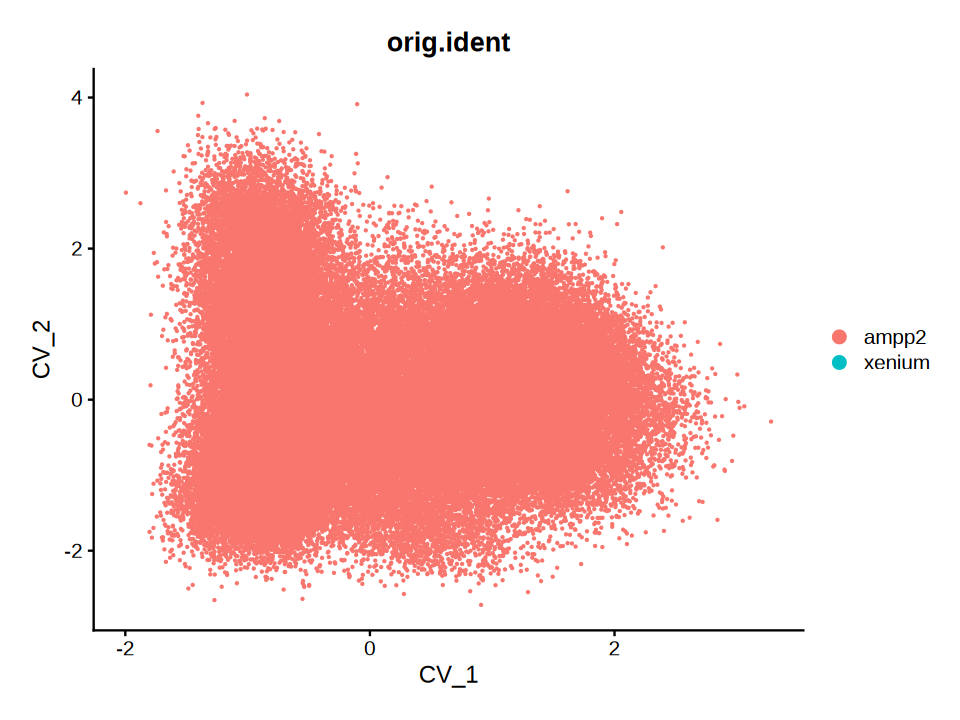

Warning message:
“Removed 3491 rows containing missing values or values outside the scale range
(`geom_point()`).”


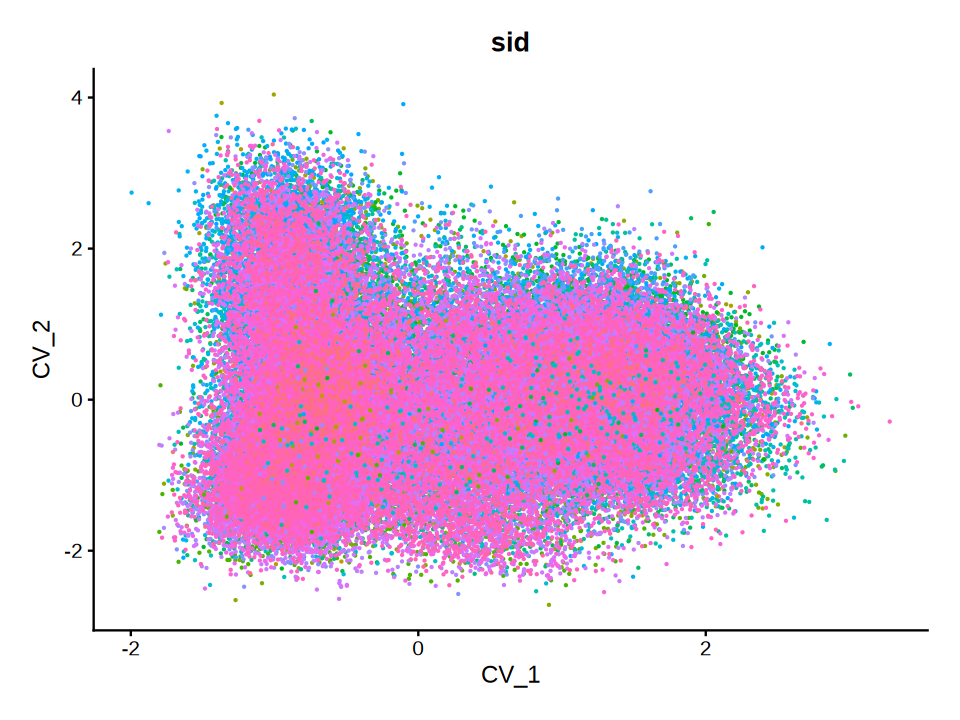

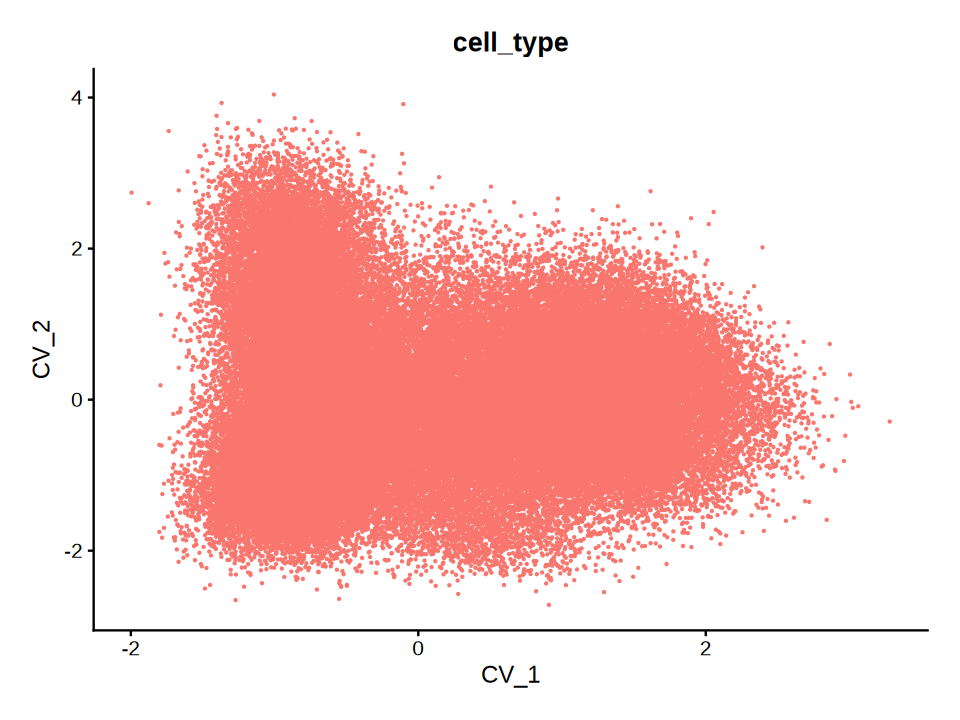

In [71]:
fig.size(6,8)
DimPlot(merged, reduction = 'cca', group.by = 'orig.ident')
DimPlot(merged, reduction = 'cca', group.by = 'sid') + NoLegend()
DimPlot(merged, reduction = 'cca', group.by = 'cell_type') + NoLegend()

Transposing data matrix

Initializing state using k-means centroids initialization

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 9448600)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 9448600)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 9448600)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 9448600)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 9448600)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 9448600)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 9448600)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 9448600)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 9448600)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 9448600)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10

Warning message:
“The `sl

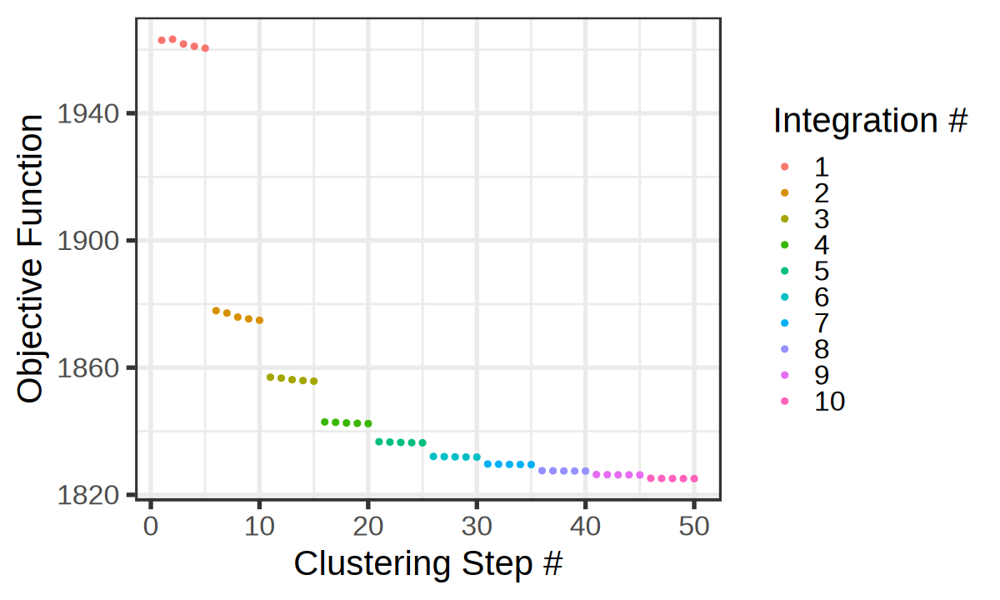

In [35]:
set.seed(1)
plan(multisession, workers=35)
merged <- harmony::RunHarmony(merged, c('orig.ident', "sid"), plot_convergence = TRUE, max_iter = 10, reduction.use = "cca",
                 early_stop = F)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



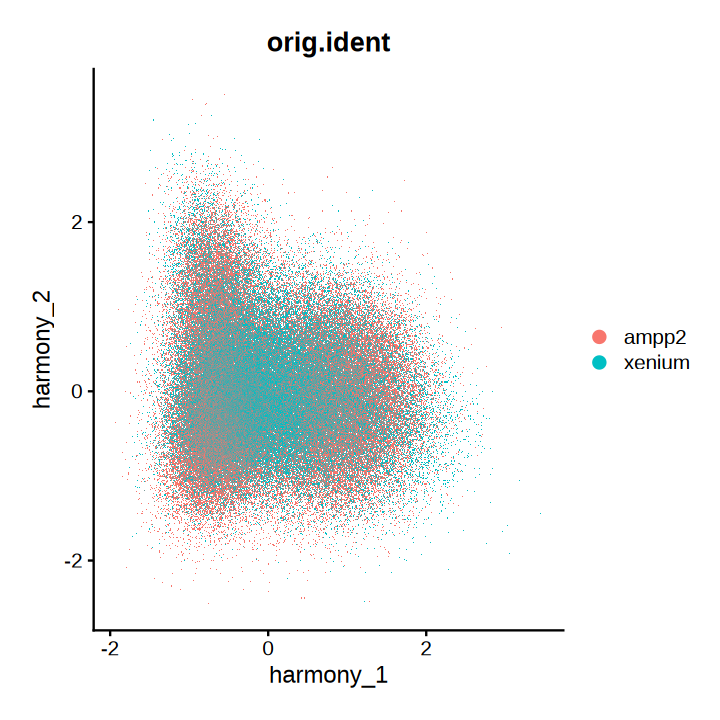

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



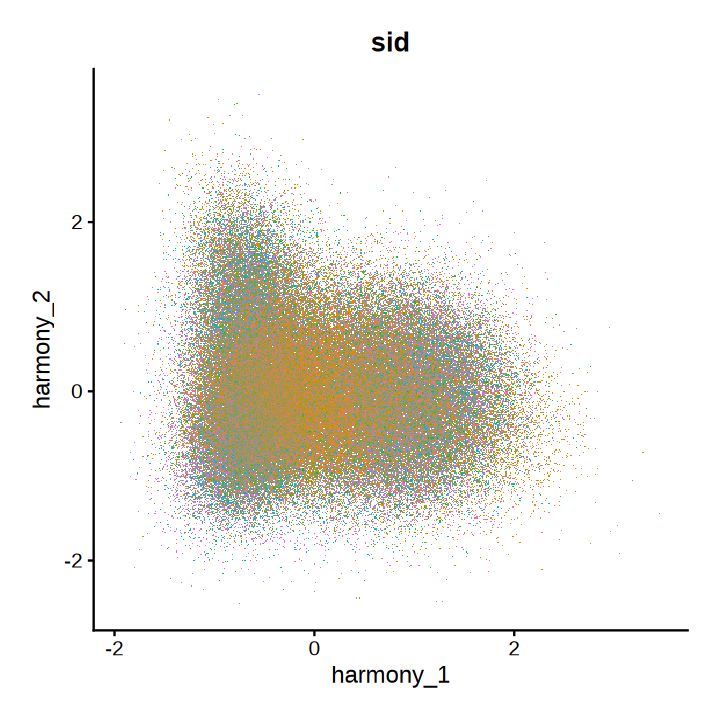

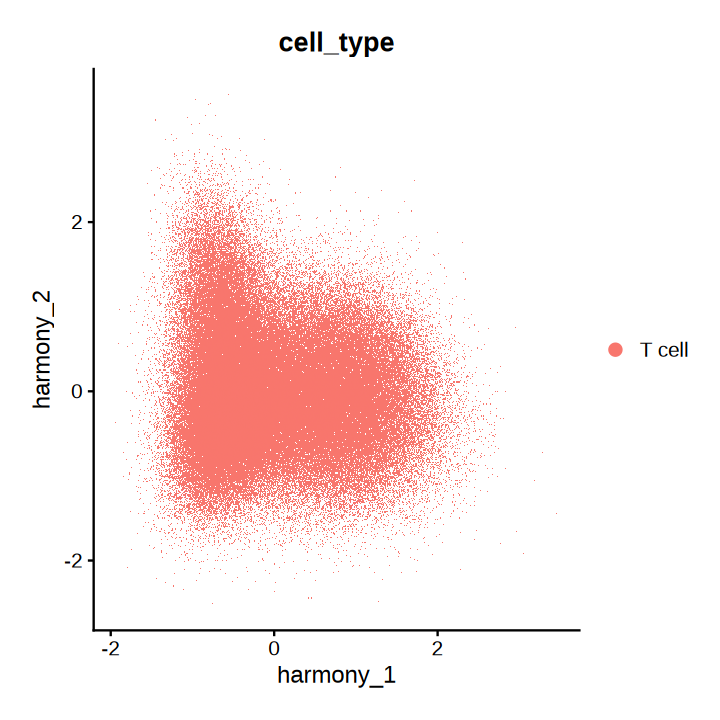

In [428]:
fig.size(6,6)
DimPlot(merged, reduction = "harmony", group.by = "orig.ident") 
fig.size(6,6)
DimPlot(merged, reduction = "harmony", group.by = "sid") + NoLegend()
DimPlot(merged, reduction = "harmony", group.by = "cell_type")

In [36]:
Run_uwot_umap <- function(SeuratObj, embedding, min_dist = 0.3, spread = 0.8){
    HU <- uwot::umap(SeuratObj@reductions[[embedding]]@cell.embeddings, min_dist = min_dist, 
                 spread = spread, ret_extra = 'fgraph', fast_sgd = FALSE)
    colnames(HU$embedding) = c('HUMAP1', 'HUMAP2')
    rownames(HU$fgraph) = colnames(HU$fgraph) = Cells(SeuratObj)
    SeuratObj[['humap']] <- Seurat::CreateDimReducObject(
        embeddings = HU$embedding,
        assay = 'RNA',
        key = 'HUMAP_',
        global = TRUE
    )
    HU_graph <- Seurat::as.Graph(HU$fgraph)
    DefaultAssay(HU_graph) <- DefaultAssay(SeuratObj)
    SeuratObj[['humap_fgraph']] <- HU_graph
    return(SeuratObj)
    }

In [37]:
set.seed(1)
plan(multisession, workers=1)
merged <- Run_uwot_umap(merged, 'harmony', spread = 0.8, min_dist = 0.3)

In [38]:
saveRDS(merged, '../data/cache/20250919_tonly_35geneQC_20CVs_integrated.rds')

In [39]:
merged <- FindClusters(merged, graph.name = 'humap_fgraph', resolution = 1.5, verbose = TRUE)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 188972
Number of edges: 2162649

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6589
Number of communities: 19
Elapsed time: 83 seconds


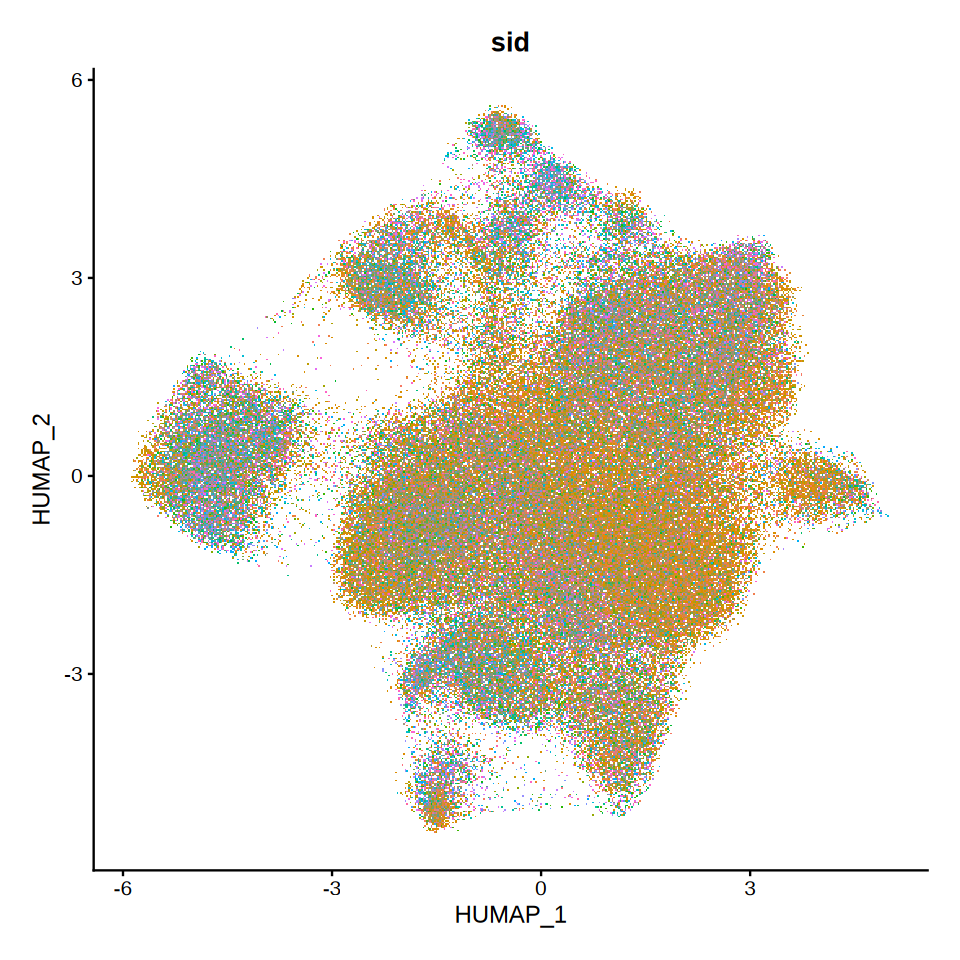

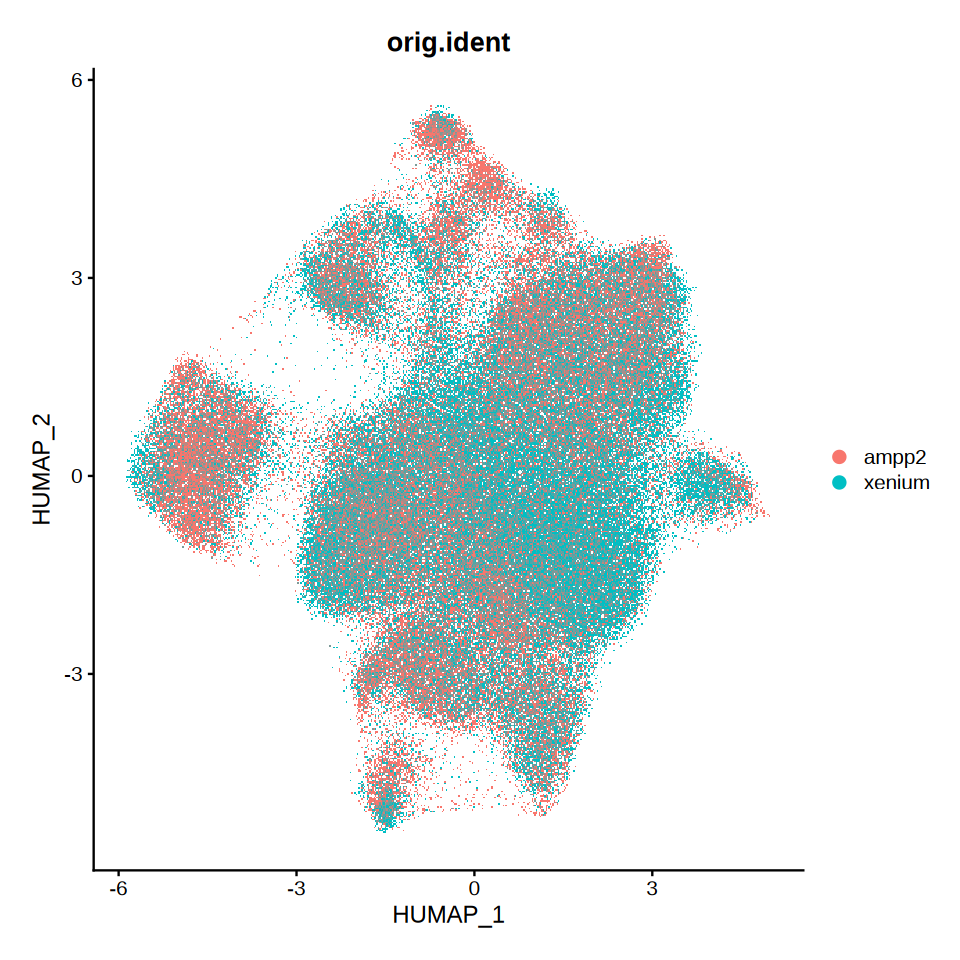

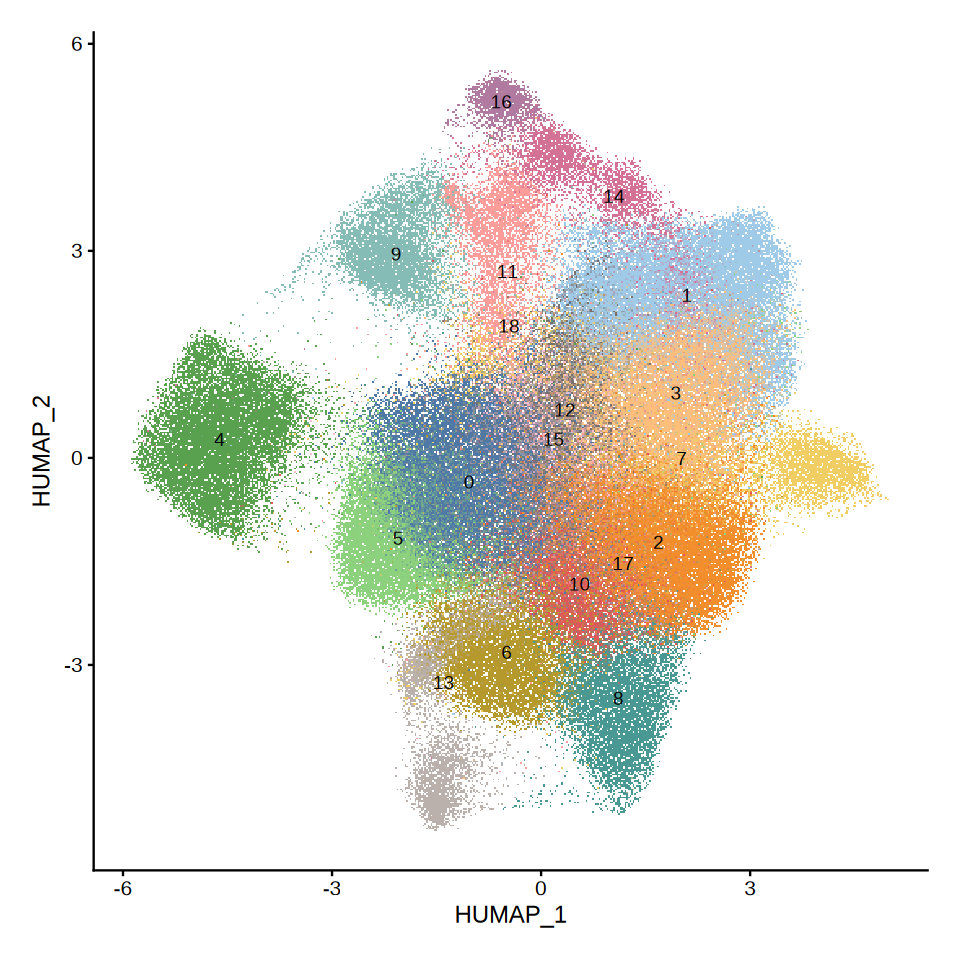

In [40]:
fig.size(8,8)
DimPlot(merged,  group.by = "sid", raster = T) + NoLegend()#+ scale_color_tableau("Tableau 10") 
DimPlot(merged, group.by = "orig.ident", raster =T) #+ scale_color_tableau("Tableau 10") 
DimPlot(merged, label = T, raster = T) + NoLegend() + scale_color_tableau("Tableau 20")

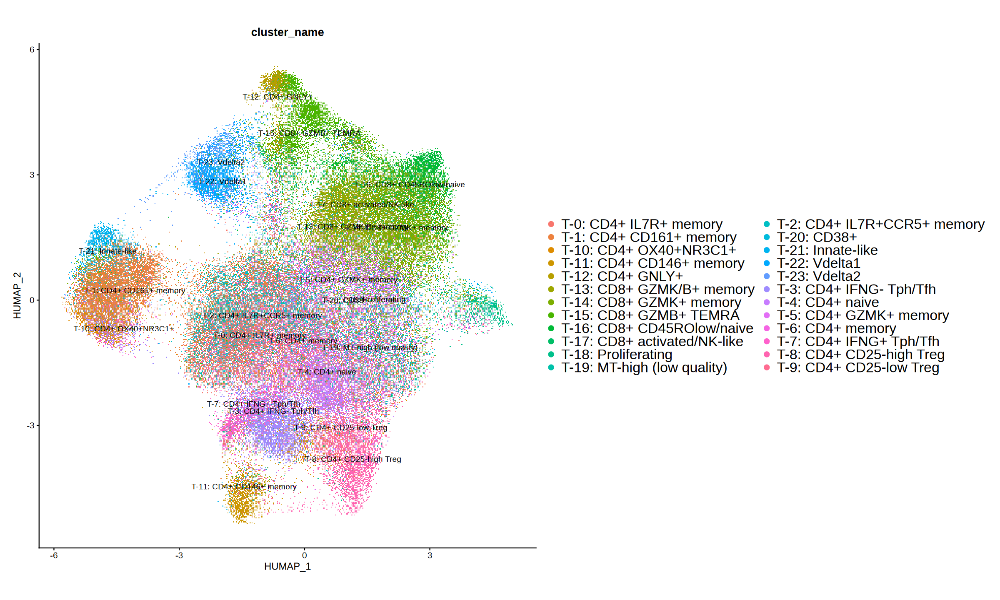

In [433]:
fig.size(12,20)
DimPlot(merged, cells = colnames(merged)[merged$orig.ident == "ampp2"], label.size = 4,
        group.by = "cluster_name", label = T, raster =T) + theme(legend.text=element_text(size=20)) + coord_fixed()

### Visualizing markers

Warning message:
“The `slot` argument of `FetchData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”
Warning message:
“The following variables could not be found: ZBTB16, MKI67”
Warning message:
“The following requested variables were not found: ZBTB16, MKI67”


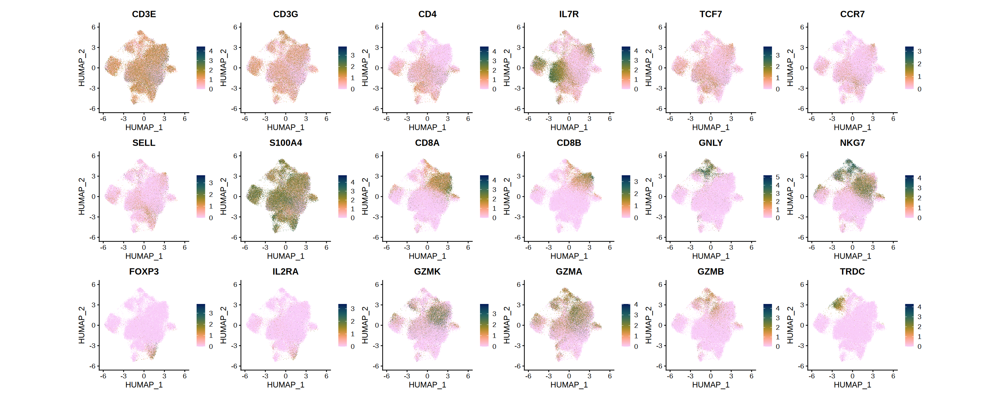

In [267]:
m <- c("CD3E", "CD3G", "CD3D",# Tcells
       "CD4", # CD4
       "IL7R", "TCF7", "CCR7", "SELL", "S100A4", # memory / naive 
       "CD8A", "CD8B",
       "GNLY", "NKG7", #NK
       "FOXP3", "IL2RA", #Treg
       "GZMK", "GZMA", "GZMB",
       "CXCL13",  "CCL5", #"CXCR5",
       "TRDC", "ZBTB16", "MKI67"
       )
m.int <- intersect(m, rownames(merged))
fig.size(10,25)
suppressMessages(FeaturePlot(merged, raster = T, features = m.int, ncol = 6) & 
                 scico::scale_color_scico(palette = 'batlow', direction = -1) & coord_fixed() )

Warning message:
“The following variables could not be found: ZBTB16, MKI67”
Warning message:
“The following requested variables were not found: ZBTB16, MKI67”


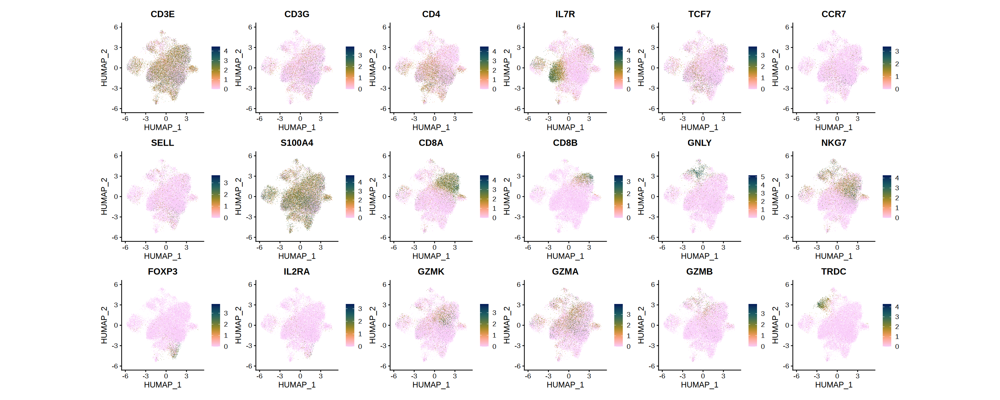

In [268]:
fig.size(10, 25)
suppressMessages(FeaturePlot(merged, raster = T, features = m.int, ncol = 6,
                             cells = colnames(merged)[merged$orig.ident == "xenium"]) & 
                 scico::scale_color_scico(palette = 'batlow', direction = -1) & coord_fixed())

Warning message:
“The following variables could not be found: ZBTB16, MKI67”
Warning message:
“The following requested variables were not found: ZBTB16, MKI67”


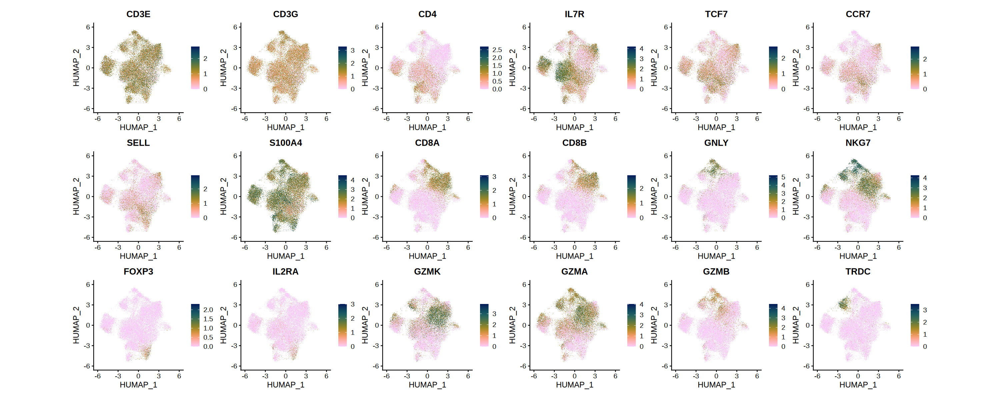

In [269]:
suppressMessages(FeaturePlot(merged, raster = T, features = m.int, ncol = 6,
                             cells = colnames(merged)[merged$orig.ident == "ampp2"]) & 
                 scico::scale_color_scico(palette = 'batlow', direction = -1) & coord_fixed())

In [270]:
# Visualizing protein data 

adt_exprs_norm <- readRDS("/data/srlab/fzhang/amp/results/2020_01_22_AMP_cite_seq_QC/adt_exprs_norm_filter_2020-02-18.rds") # adt_exprs_norm are CLR normalized and QCed
t_proteins <- adt_exprs_norm[rownames(cca_res$ycoef), merged@meta.data[merged$orig.ident == 'ampp2', 'cell']]

In [271]:
xenium_proteins <- pracma::zeros(length(rownames(cca_res$ycoef)), dim(subset(merged, merged$orig.ident == 'xenium'))[2])
colnames(xenium_proteins) <- colnames(merged)[merged$orig.ident == 'xenium']
rownames(xenium_proteins) <- rownames(cca_res$ycoef)
t_proteins <- cbind(t_proteins, xenium_proteins)

merged[['ADT']] <- CreateAssayObject(t_proteins)
Assays(merged)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] "RNA" "ADT"

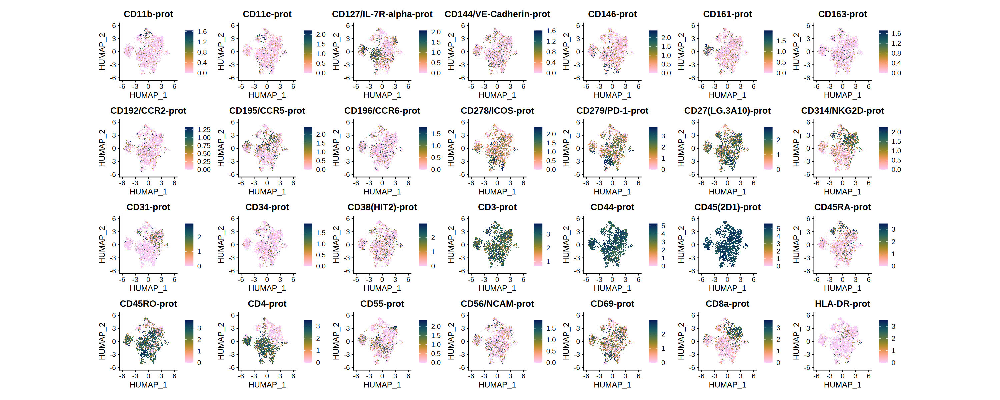

In [272]:
fig.size(10, 25)
DefaultAssay(merged) <- 'ADT'
suppressMessages(FeaturePlot(merged, raster = T, features = rownames(merged), ncol = 7, max.cutoff = 'q95', order = TRUE, 
                             cells = colnames(merged)[merged$orig.ident == "ampp2"]) & 
                                 scico::scale_color_scico(palette = 'batlow', direction = -1) & 
                                 coord_fixed())

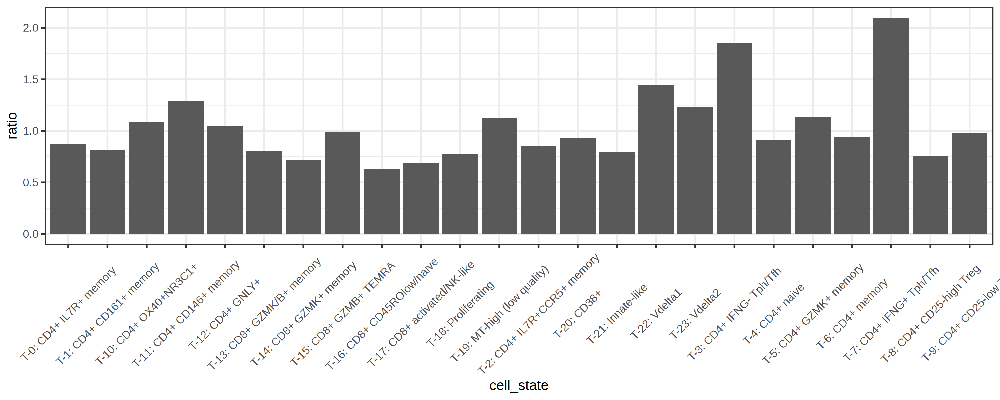

In [273]:
check_protein_dist <- function(prot) {

    high_exp <- t_proteins[prot, cume_dist(t_proteins[prot, grepl("BRI", colnames(t_proteins))]) > .85]
    high_exp_dist <- table(merged@meta.data[merged$cell %in% names(high_exp), 'cluster_name'])
    high_exp_dist <- high_exp_dist/sum(high_exp_dist)
    full_dist <- table(merged@meta.data[merged$orig.ident == 'ampp2', 'cluster_name'])
    full_dist <- full_dist/sum(full_dist)

    p <- ggplot(as.data.frame(cbind(high_exp_dist, full_dist)) %>% rownames_to_column('cell_state') %>% mutate(ratio = high_exp_dist/full_dist), 
           aes(x = cell_state, y = ratio)) + 
        geom_bar(stat='identity', position='dodge') + 
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))
    
    print(p) 
}

check_protein_dist('CD144/VE-Cadherin_prot')


### Verifying that Seurat clusters and AMPp2 cell states still co-localize

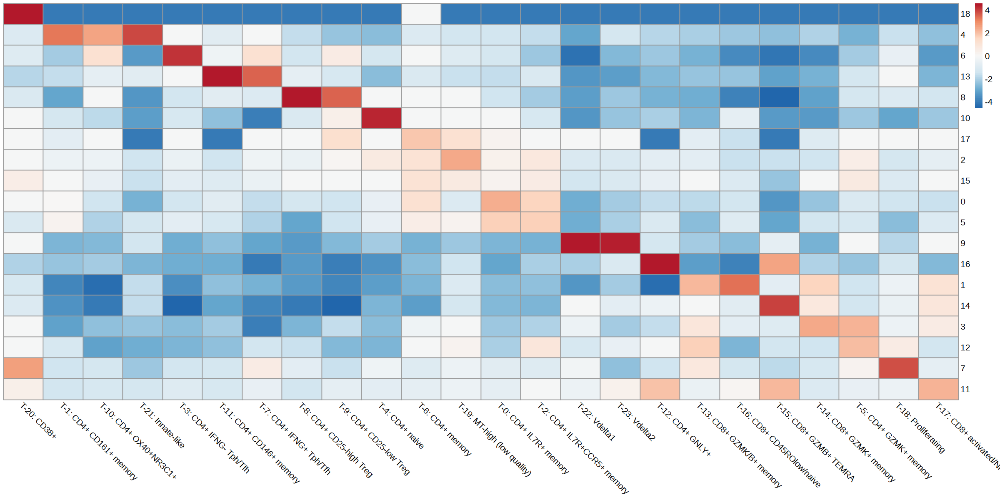

In [49]:
# Calculating cluster specificity 

calculate_OR <- function(sc.seurat, leiden_res, sub.cluster = FALSE) {
    col = ifelse(sub.cluster, 'sub.cluster', paste0('humap_fgraph_res.', leiden_res))
    test <- as.data.frame(table(sc.seurat@meta.data[[col]], sc.seurat$cluster_name)) %>% 
        rename(seurat_cluster = Var1, AMPp2_annot = Var2)
    
    a <- test$Freq 
    b <- test %>% 
        group_by(seurat_cluster) %>% 
        mutate(total = sum(Freq)) %>% 
        ungroup() %>% 
        mutate(clust_not_cs = total - Freq) %>% 
        pull(clust_not_cs) 
    c <- test %>% 
        group_by(AMPp2_annot) %>% 
        mutate(total = sum(Freq)) %>% 
        mutate(cs_not_clust = total - Freq) %>% 
        pull(cs_not_clust) 
    d <- test %>% 
        mutate(total = sum(Freq)) %>% 
        mutate(not_cs_not_clust = total - Freq - b - c) %>% 
        pull(not_cs_not_clust)
    
    fig.size(10, 20)

    test$OR <- (a * d) / (b * c)
    zscores <- log(test$OR)/sqrt(1/a + 1/b + 1/c + 1/d)
    pvals <- 2 * (1 - pnorm(abs(zscores)))

    padj_bonf <- p.adjust(pvals, method = 'bonferroni')
    #test$OR[padj_bonf > 0.05] = 1
    #test$OR[test$OR < 1] = 1 
    ggplot(test, aes(x = seurat_cluster, y = AMPp2_annot, fill = log(OR))) + 
        geom_tile() + 
        scale_fill_gradient2(low = "blue", mid = 'white', high = "red", midpoint = 0) + 
        theme_minimal(base_size=20)

    test_pheatmap <- test %>% 
        dplyr::select(-Freq) %>% 
        mutate(OR = case_when(
            OR == 0 ~ -4, 
            pvals > 0.05 ~ 0, 
            .default = log(OR)
            )
        ) %>% 
        pivot_wider(names_from = AMPp2_annot, values_from = OR) %>% 
        column_to_rownames('seurat_cluster') 
    
    clust_result <- pheatmap::pheatmap(test_pheatmap, cluster_rows = TRUE, cluster_cols = FALSE, silent = TRUE)
    row_order <- clust_result$tree_row$order

    # Step 2: Apply row clustering to data
    clustered_data <- test_pheatmap[row_order, ]

    # Step 3: Compute max value row index for each column
    max_indices <- apply(clustered_data, 2, which.max)

    # Step 4: Sort columns by where their max value appears
    col_order <- order(max_indices)
    clustered_sorted_data <- clustered_data[, col_order]

    fig.size(10, 20)
    pheatmap::pheatmap(
        clustered_sorted_data, 
        cluster_rows = FALSE,
        cluster_cols = FALSE,
        angle_col = "315", 
        fontsize = 12,
        color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100), 
        breaks = seq(-4.5, 4.6, length.out = 101)
    )
}
# Note: you can subcluster here, check 20250806_cca_benchmarks.ipynb 
calculate_OR(merged, leiden_res = 1.5)

In [45]:
merged <- FindClusters(merged, graph.name = 'humap_fgraph', resolution = 1.5, verbose = TRUE)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 188972
Number of edges: 2162649

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6589
Number of communities: 19
Elapsed time: 58 seconds


In [46]:
Idents(sc.seurat) <- 'humap_fgraph_res.1.5'
merged <- FindSubCluster(merged, cluster = 4, graph.name = 'humap_fgraph', resolution = 0.4)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16236
Number of edges: 174782

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6811
Number of communities: 3
Elapsed time: 1 seconds


In [394]:
merged_28 <- readRDS('../data/cache/20250813_tonly_integrated_cellstatestransferred.RDS')

In [405]:
merged_28 <- subset(merged_28, cells = colnames(merged_28)[merged_28$orig.ident == 'ampp2'])

In [406]:
merged_28 <- FindClusters(merged_28, graph.name = 'humap_fgraph', resolution = 1.5, verbose = TRUE)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 93687
Number of edges: 710450

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7085
Number of communities: 54
Elapsed time: 15 seconds


28 singletons identified. 26 final clusters.

Warning message:
“Adding a command log without an assay associated with it”


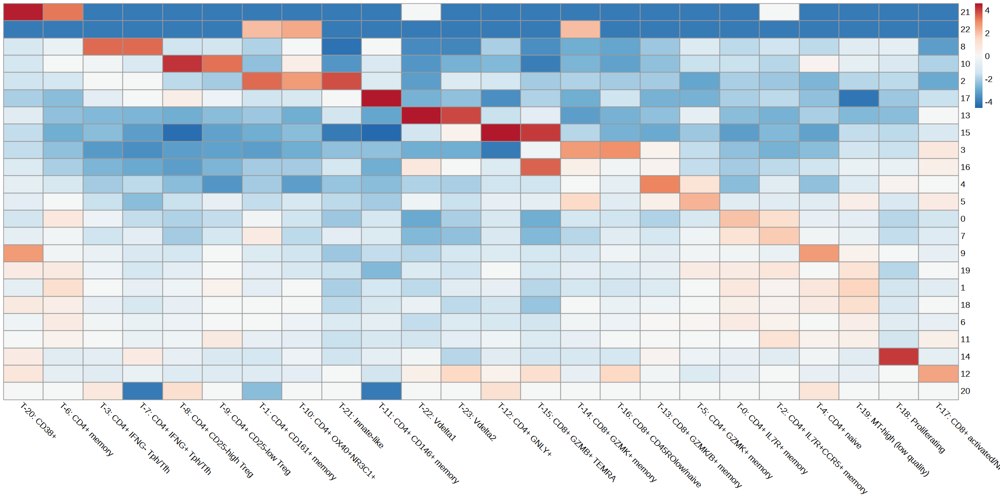

In [397]:
calculate_OR(merged_28, 1.5)

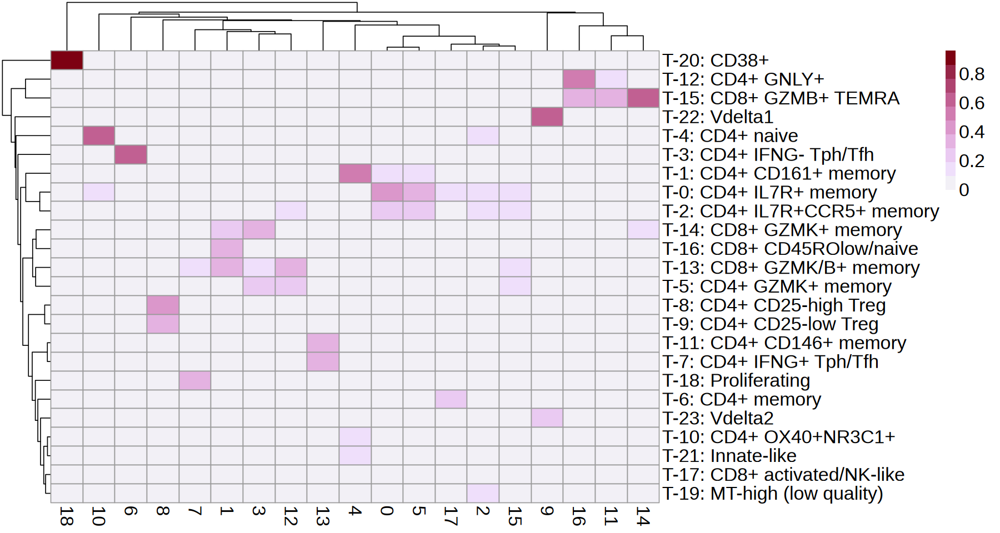

In [435]:
# In a cluster, what proportion of cells come from a particular cell state? 
data.frame(table(merged$cluster_name, merged$humap_fgraph_res.1.5)) %>% group_by(Var2) %>% mutate(clusterSum = sum(Freq)) %>% mutate(prop = Freq/clusterSum) %>% 
dplyr::select(Var1, Var2, prop) %>% tidyr::pivot_wider(id_cols = Var1, names_from = Var2, values_from = prop) %>% 
tibble::column_to_rownames("Var1") -> prop.t

fig.size(8,15)
pheatmap::pheatmap(prop.t, scale = "none", cluster_rows = T, cluster_cols = T, color = hcl.colors(10, "Red-Purple", rev=T), fontsize = 20, show_rownames = TRUE)

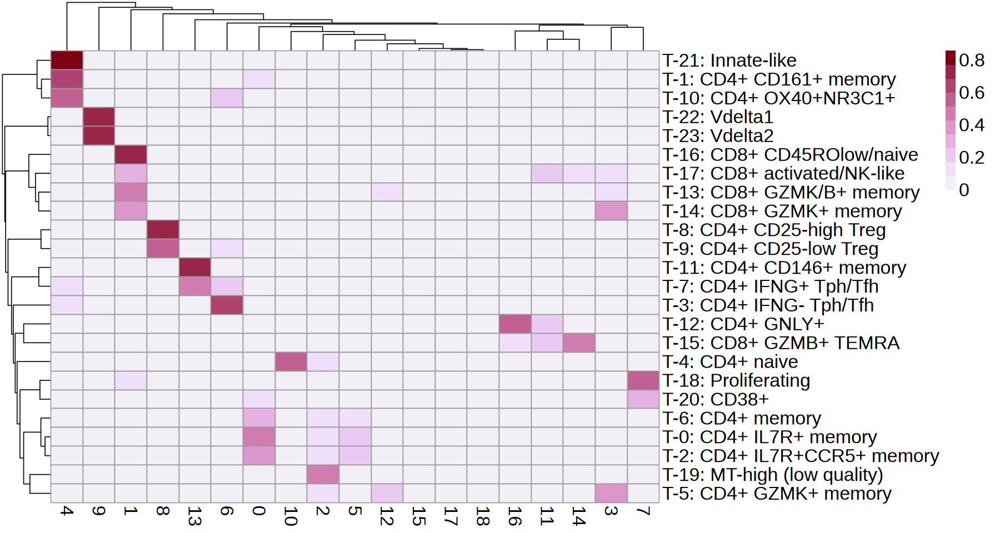

In [436]:
# In a cell state, what proportion of cells come from a specific cluster? 
data.frame(table(merged$cluster_name, merged$humap_fgraph_res.1.5)) %>% group_by(Var1) %>% mutate(clusterSum = sum(Freq)) %>% mutate(prop = Freq/clusterSum) %>% 
dplyr::select(Var1, Var2, prop) %>% tidyr::pivot_wider(id_cols = Var1, names_from = Var2, values_from = prop) %>% 
tibble::column_to_rownames("Var1") -> prop.t
pheatmap::pheatmap(prop.t, scale = "none", cluster_rows = T, cluster_cols = T, color = hcl.colors(10, "Red-Purple", rev=T), fontsize = 20)

### QC check

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


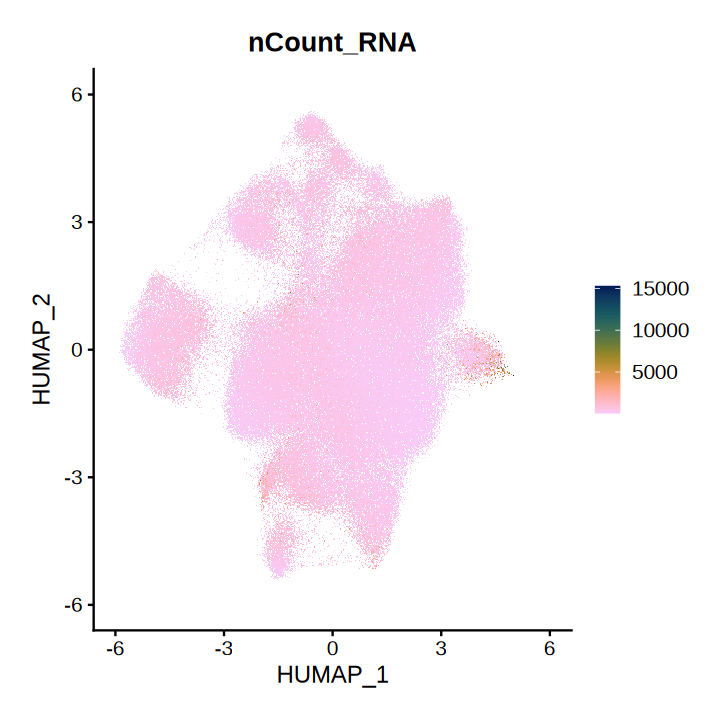

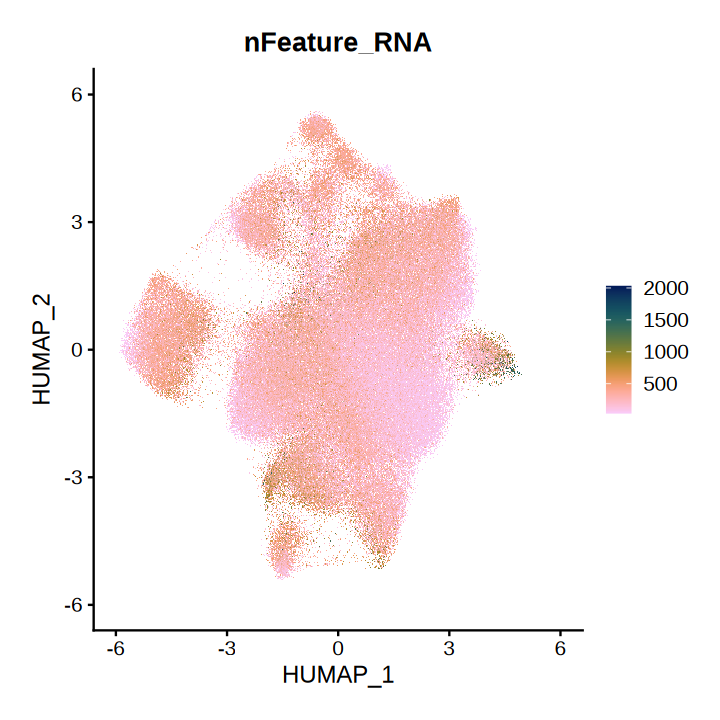

In [437]:
fig.size(6,6)
FeaturePlot(merged, features = "nCount_RNA", order = F) & scico::scale_color_scico(palette = 'batlow', direction = -1)
FeaturePlot(merged, features = "nFeature_RNA", order = F) & scico::scale_color_scico(palette = 'batlow', direction = -1)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


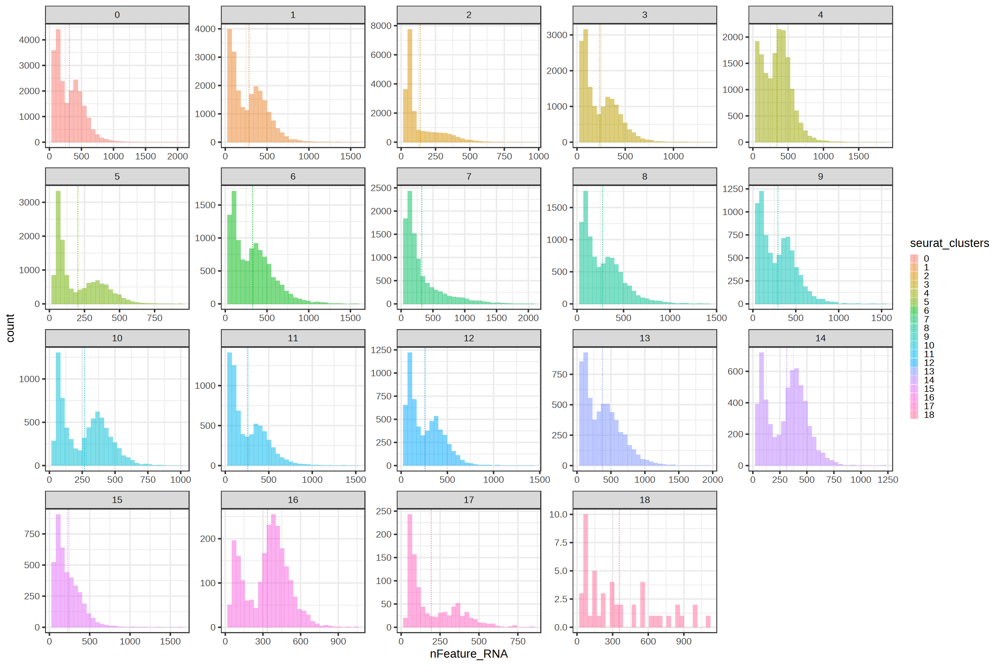

In [438]:
fig.size(20, 30)
merged@meta.data %>% dplyr::select(nFeature_RNA, nCount_RNA, seurat_clusters) %>% group_by(seurat_clusters) %>% mutate(c.mean = mean(nFeature_RNA)) %>% 
ggplot() + geom_histogram(aes(x = nFeature_RNA, fill = seurat_clusters), position="identity", alpha=0.5) + geom_vline(aes(xintercept=c.mean, color=seurat_clusters),
             linetype="dashed") + facet_wrap(~seurat_clusters, ncol = 5, scales = 'free')

## Cache

In [439]:
saveRDS(merged, '../data/cache/20250817_tonly_integrated_20CVs.RDS')

In [4]:
merged <- readRDS('../data/cache/20250817_tonly_integrated_20CVs.RDS')

In [10]:
meta = merged[[]]
xen_counts = LayerData(merged, layer='counts.xenium')
amp_counts = LayerData(merged, layer='counts.AMPp2')
amp_counts = amp_counts[rownames(xen_counts), ]
t_harm = Embeddings(merged, reduction='harmony')

In [12]:
write.csv(meta, '../data/cache/20251204_t_cellmeta.csv')
write.csv(t_harm, '../data/cache/20251204_totalt_harmony.csv')
writeMM(xen_counts, '../data/cache/20251204_xenium_tcounts.mtx')
writeMM(amp_counts, '../data/cache/20251204_amp_tcounts.mtx')
writeLines(rownames(amp_counts), '../data/cache/20251204_ampp2_tcounts_genes.txt')
writeLines(colnames(amp_counts), '../data/cache/20251204_ampp2_tcounts_cellnames.txt')
writeLines(colnames(xen_counts), '../data/cache/20251204_xenium_tcounts_cellnames.txt')

## kNN classifier annotation

Warning message:
“Removed 531 rows containing non-finite outside the scale range
(`stat_count()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_bar()`).”


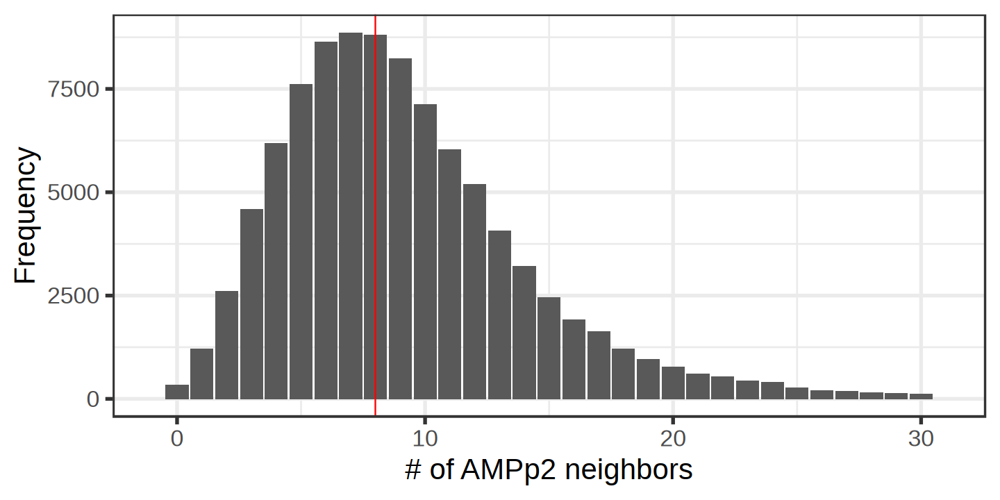

In [5]:
compute_nneighbors <- function(seurat_obj) {
    umap_graph <- seurat_obj@graphs[['humap_fgraph']]
    AMPp2_cells <- grepl('BRI', rownames(umap_graph))
    xenium_cells <- !AMPp2_cells 
    umap_graph <- umap_graph[xenium_cells, AMPp2_cells] > 0 
    dist <- as.data.frame(rowSums(umap_graph)) %>% rename(V1 = 'rowSums(umap_graph)')
    fig.size(6, 12)
    ggplot(dist, aes(x = V1)) + 
        geom_bar(position='dodge') + 
        xlim(-1, 31) + 
        geom_vline(xintercept = median(dist$V1), col = 'red') + 
        labs(x = '# of AMPp2 neighbors', 
             y = 'Frequency')
        
}

compute_nneighbors(merged)


In [6]:
cell_subtypes <- subset(merged, orig.ident == 'ampp2')@meta.data %>% 
    mutate(cell_subtype = case_when(
        grepl('CD4+', cluster_name) ~ "CD4+ T cell", 
        grepl('CD8+', cluster_name) ~ "CD8+ T cell", 
        grepl("Innate", cluster_name) ~ "MAIT cell", 
        grepl("delta", cluster_name) ~ "gdT cell", 
        grepl("low quality", cluster_name) ~ "Low quality", 
        grepl("Proliferating", cluster_name) ~ "Proliferating", 
        .default = 'CD38+ T cell'
        )
           )

merged <- AddMetaData(merged, cell_subtypes, 'cell_subtype')

In [7]:
levels(factor(merged$cell_subtype))

[1] "CD38+ T cell"  "CD4+ T cell"   "CD8+ T cell"   "gdT cell"     
[5] "Low quality"   "MAIT cell"     "Proliferating"

In [9]:
#plan(multisession, workers=35)

In [51]:
knn_maj_label_transfer <- function(seurat_obj, label_col, winning_label = FALSE) {
    umap_graph <- seurat_obj@graphs[['humap_fgraph']]
    ampp2_cells <- grepl('BRI', rownames(umap_graph))
    xenium_cells <- !ampp2_cells 
    
    all_labels <- seurat_obj@meta.data[[label_col]]
    all_labels <- all_labels[ampp2_cells]
    poss_labels <- levels(factor(all_labels))
    all_labels <- match(all_labels, poss_labels)

    one_hot <- sparseMatrix(
        i = seq_along(all_labels), 
        j = all_labels, 
        x = 1, 
        dims = c(sum(ampp2_cells), length(poss_labels))
        )
    
    res <- umap_graph[xenium_cells, ampp2_cells] %*% one_hot 
    if (winning_label) {
        res <- (umap_graph[xenium_cells, ampp2_cells] > 0) %*% one_hot
        colnames(res) <- poss_labels
        return(res)
    }
    labels <- max.col(res) 
    labels <- poss_labels[labels]
    
    updated_col <- c(labels, seurat_obj@meta.data[seurat_obj@meta.data$orig.ident == 'ampp2', label_col])
    res <- AddMetaData(seurat_obj, updated_col, label_col)
    return(res)
}
    

merged <- knn_maj_label_transfer(merged, 'cluster_name')

In [8]:
saveRDS(merged, '../data/cache/20250817_tonly_integrated_20CVs.RDS')

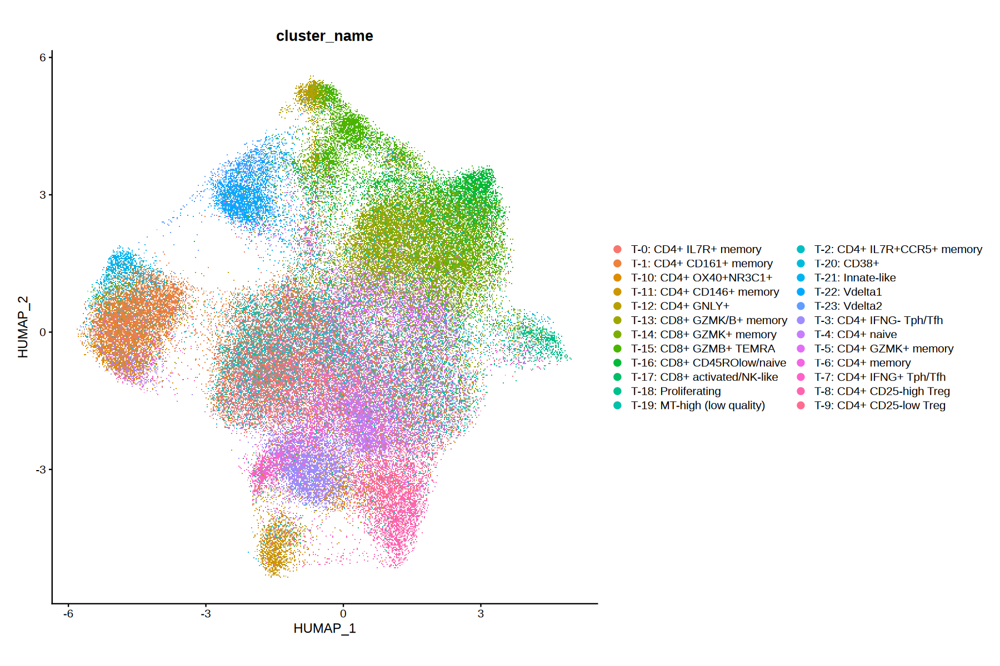

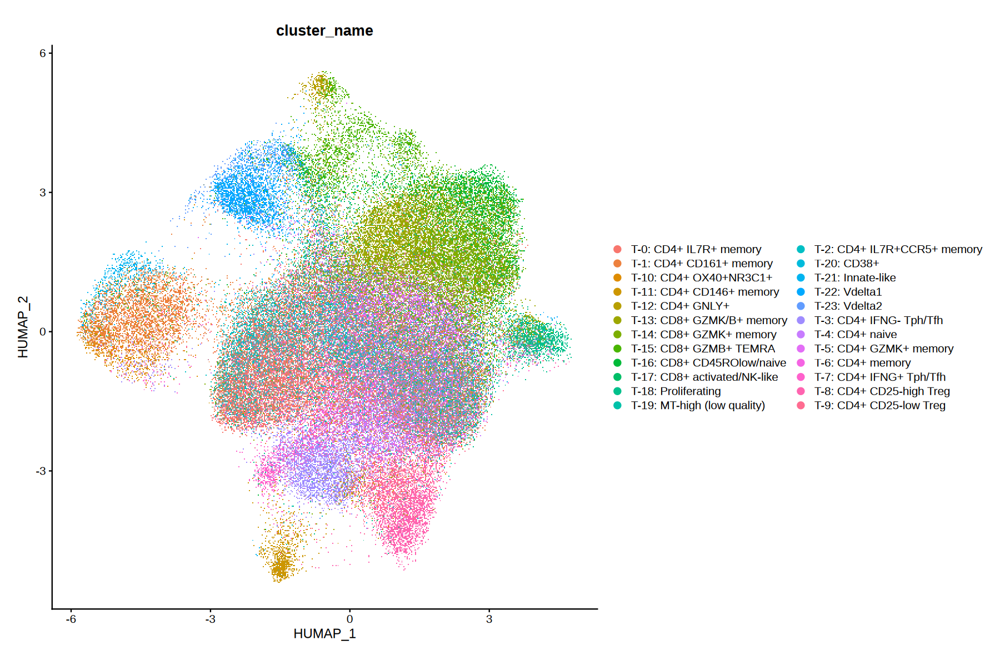

In [108]:
fig.size(10, 15)
p1 <- DimPlot(merged, group.by = "cluster_name", raster = T, cells = colnames(merged_old)[merged_old$orig.ident == 'ampp2']) + coord_fixed() + NoLegend()
p2 <- DimPlot(merged, group.by = "cluster_name", raster = T, cells = colnames(merged_old)[merged_old$orig.ident == 'xenium']) + coord_fixed() + NoLegend()
legend = 

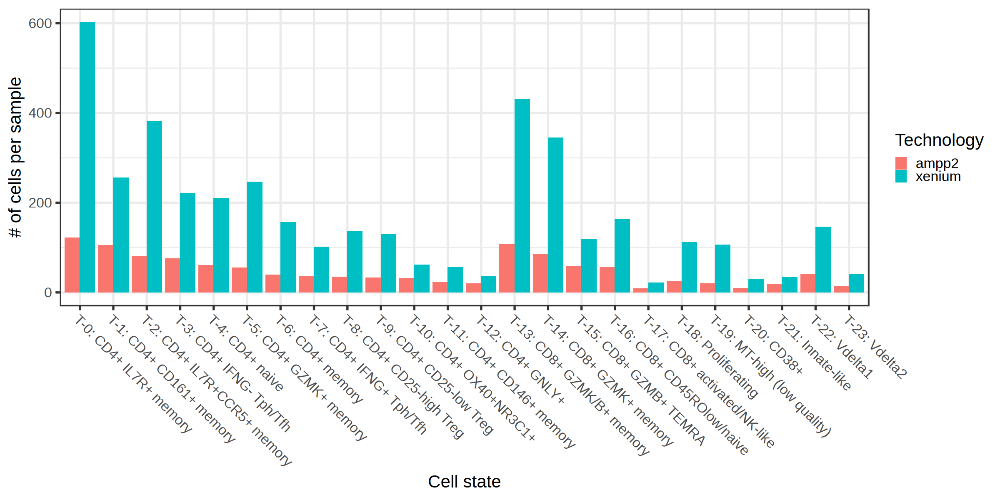

In [160]:
fig.size(10, 20)
merged_old@meta.data %>% 
    group_by(orig.ident, cluster_name) %>%  
    summarize(freq =n(),
              num_samples = n_distinct(sid),
              .groups = 'keep') %>% 
    group_by(orig.ident) %>% 
    mutate(prop = freq/max(num_samples), 
           cluster_name = factor(cluster_name, levels = str_sort(unique(cluster_name), numeric = TRUE), ordered = TRUE)) %>% 
    dplyr::select(-num_samples) %>% 
    ggplot(aes(x = cluster_name, y = prop, fill = orig.ident)) + 
        geom_col(position = 'dodge') + 
        theme(axis.text.x = element_text(angle = 315, hjust = 0)) + 
        labs(x = 'Cell state', 
             y = '# of cells per sample', 
             fill = 'Technology')

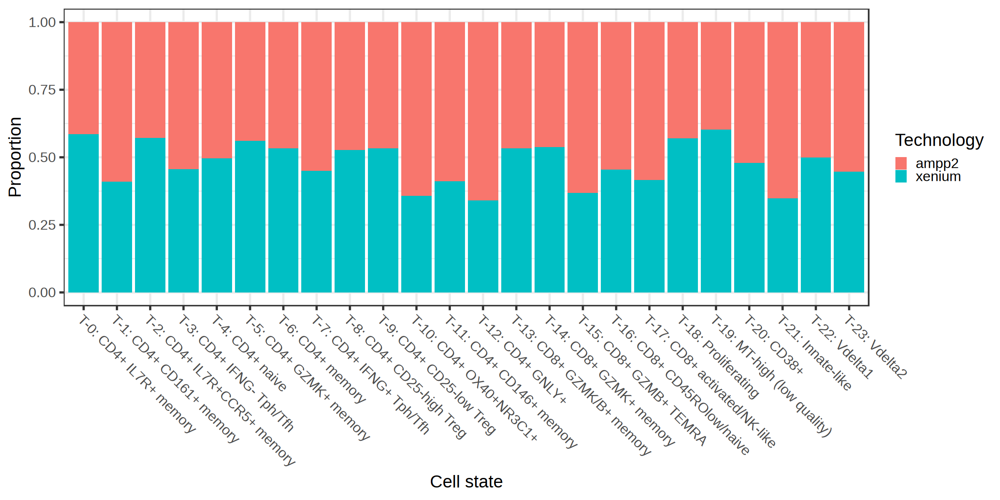

In [161]:
fig.size(10, 20)
merged_old@meta.data %>% 
    group_by(orig.ident, cluster_name) %>%  
    summarize(freq = n(), 
              num_samples = n_distinct(sid), 
              .groups = 'keep') %>% 
    group_by(cluster_name) %>% 
    mutate(prop = freq/sum(freq), 
           prop_per_sample = case_when(
               orig.ident == 'ampp2' ~ freq/81, 
               orig.ident == 'xenium' ~ freq/23)
           ) %>% 
    ungroup() %>% 
    mutate(cluster_name = factor(cluster_name, levels = str_sort(unique(cluster_name), numeric = TRUE), ordered = TRUE)) %>% 
    ggplot(aes(x = cluster_name, y = prop, fill = orig.ident)) + 
        geom_col(position = 'stack') + 
        theme(axis.text.x = element_text(angle = 315, hjust = 0)) + 
        labs(x = 'Cell state', 
             y = 'Proportion', 
             fill = 'Technology')

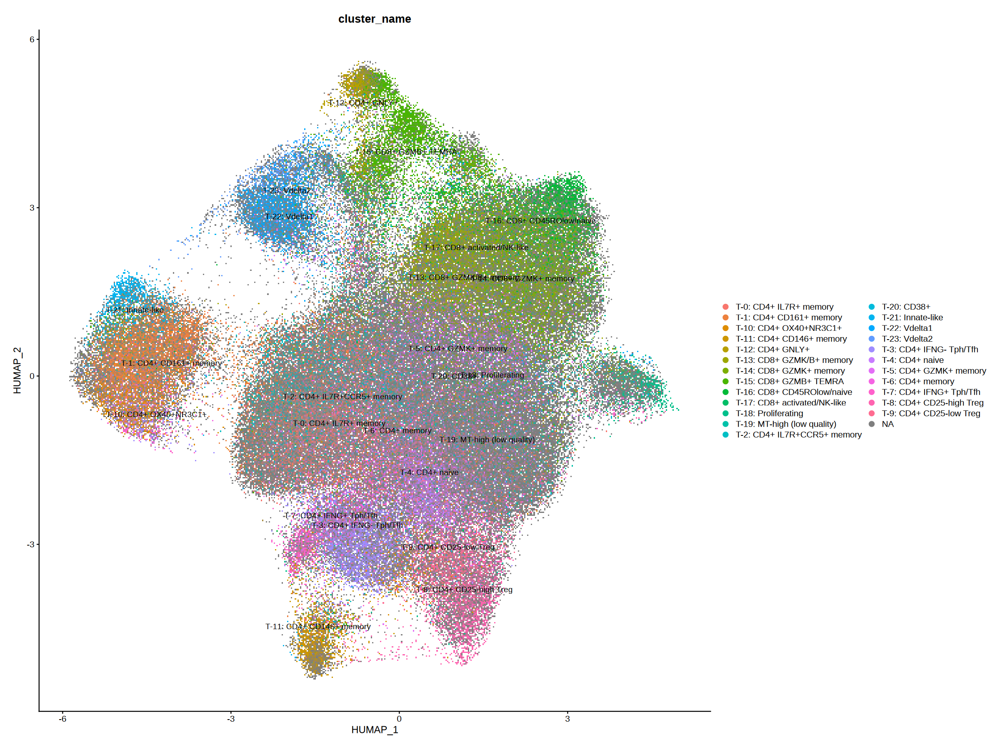

In [66]:
fig.size(15, 20)
DimPlot(merged, group.by = "cluster_name", raster = T, label = T) + coord_fixed()

In [42]:
saveRDS(merged, '../data/cache/20250813_tonly_integrated_cellstatestransferred.RDS')

In [ ]:
merged <- readRDS('../data/cache/20250817_tonly_integrated_20CVs.RDS')

In [22]:
merged@meta.data[, c('cell', 'cluster_name')] %>% dplyr::rename('cid' = 'cell') %>% write.table('../data/cache/Tcell_states.csv', quote = FALSE, row.names = FALSE)

In [ ]:
write.csv(merged@meta.data[['cluster_name']], '../data/cache/Tcell_states.csv')

In [5]:
merged <- readRDS('../data/cache/20250813_tonly_integrated_cellstatestransferred.RDS')

## Markers for Xenium and AMPp2

In [6]:
merged.xenium <- subset(merged, cells = colnames(merged)[!grepl('BRI', colnames(merged))])
#merged.xenium.qc <- subset(merged.xenium, cells = colnames(merged.xenium)[merged.xenium$nFeature_RNA > 150])
merged.ampp2 <- subset(merged, cells = colnames(merged)[grepl('BRI', colnames(merged))])

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


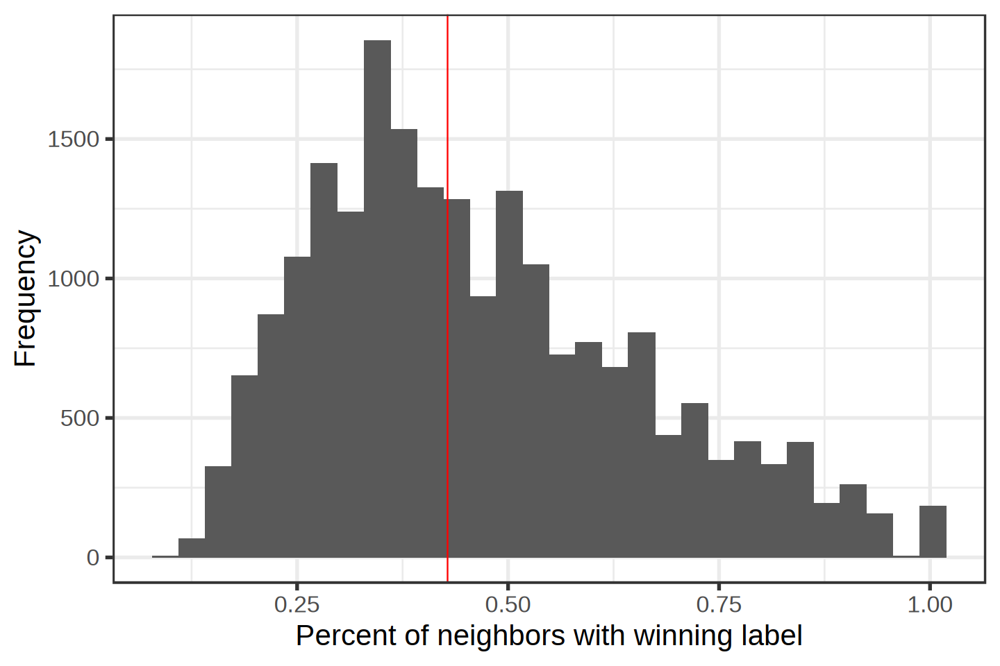

In [234]:
fig.size(8, 12)
fine_neighbor_identities <- knn_maj_label_transfer(merged, 'cluster_name', winning_label = TRUE)
fine_neighbor_identities <- fine_neighbor_identities/rowSums(fine_neighbor_identities) 
num_winning_neighbors_hq <- matrixStats::colMaxs(as.matrix(t(fine_neighbor_identities)))
med = median(num_winning_neighbors_hq)

ggplot(as.data.frame(num_winning_neighbors_hq), aes(x = num_winning_neighbors_hq)) + 
    geom_histogram(position='dodge') + 
    geom_vline(xintercept = med, col = 'red') + 
    labs(x = 'Percent of neighbors with winning label', 
         y = 'Frequency')

Warning message:
“Removed 255 rows containing non-finite outside the scale range
(`stat_count()`).”


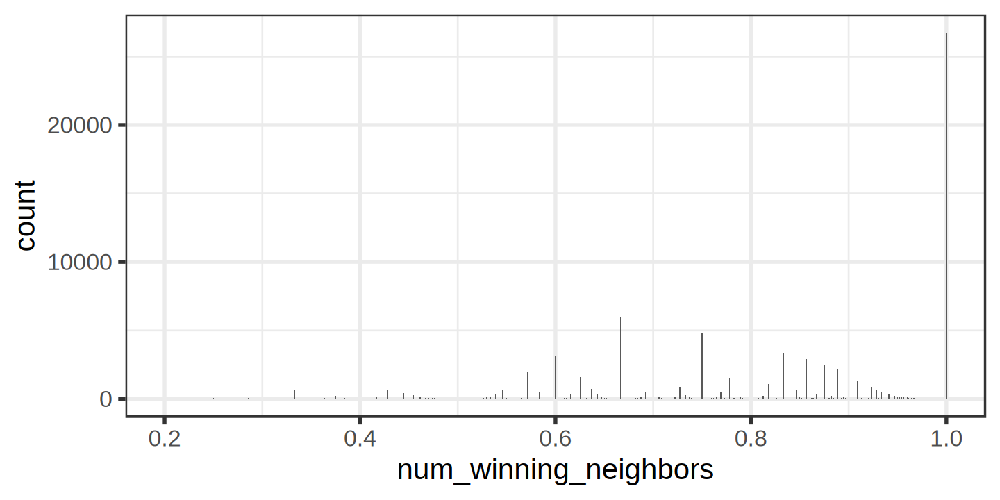

In [159]:
merged_full <- readRDS('../data/cache/20250813_tonly_integrated_cellstatestransferred.RDS')
merged_full <- knn_maj_label_transfer(merged_full, 'cell_subtype')
coarse_neighbor_identities <- knn_maj_label_transfer(merged_full, 'cell_subtype', winning_label = TRUE)
coarse_neighbor_identities <- coarse_neighbor_identities/rowSums(coarse_neighbor_identities) 
num_winning_neighbors <- matrixStats::colMaxs(as.matrix(t(coarse_neighbor_identities)))
ggplot(as.data.frame(num_winning_neighbors), aes(x = num_winning_neighbors)) + geom_bar(position='dodge')

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 255 rows containing non-finite outside the scale range (`stat_bin()`).”


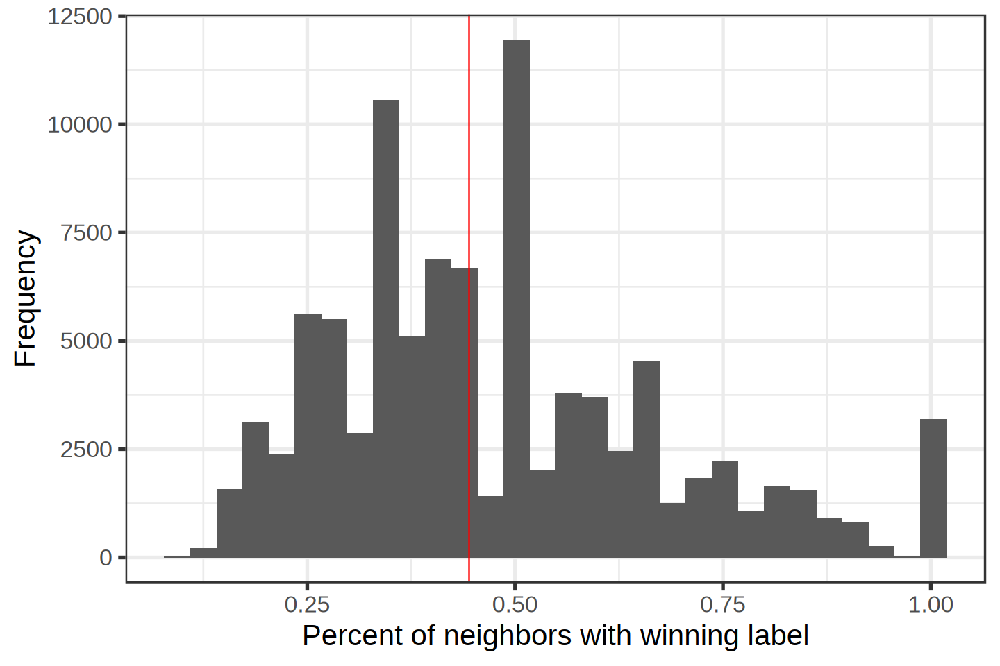

In [231]:
#merged_full <- knn_maj_label_transfer(merged_full, 'cluster_name')
fine_neighbor_identities <- knn_maj_label_transfer(merged_full, 'cluster_name', winning_label = TRUE)
fine_neighbor_identities <- fine_neighbor_identities/rowSums(fine_neighbor_identities) 
num_winning_neighbors_all <- matrixStats::colMaxs(as.matrix(t(fine_neighbor_identities)))
med <- median(num_winning_neighbors_all[!is.na(num_winning_neighbors_all)])
ggplot(as.data.frame(num_winning_neighbors_all), aes(x = num_winning_neighbors_all)) + 
    geom_histogram(position='dodge') + 
    geom_vline(xintercept = med, col = 'red') + 
    labs(x = 'Percent of neighbors with winning label', 
         y = 'Frequency')

### Gene correlations

In [7]:
# Xenium only 

xenium.markers <- presto::wilcoxauc(merged.xenium, 'cluster_name')

xenium.markers %>% 
    group_by(group) %>% 
    filter(padj < 0.05 & auc > 0.5) %>% 
    arrange(group, desc(logFC)) %>% 
    #slice_max(n = 40, order_by = logFC)%>% 
    dplyr::select(feature, group) %>% 
    mutate(row = row_number()) %>% 
    tidyr::pivot_wider(names_from = group, values_from = feature) -> show
show[1:10,]

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the presto package.
  Please report the issue to the authors.”


row,T-0: CD4+ IL7R+ memory,T-10: CD4+ OX40+NR3C1+,T-11: CD4+ CD146+ memory,T-12: CD4+ GNLY+,T-13: CD8+ GZMK/B+ memory,T-14: CD8+ GZMK+ memory,T-15: CD8+ GZMB+ TEMRA,T-16: CD8+ CD45ROlow/naive,T-17: CD8+ activated/NK-like,T-18: Proliferating,T-19: MT-high (low quality),T-1: CD4+ CD161+ memory,T-20: CD38+,T-21: Innate-like,T-22: Vdelta1,T-23: Vdelta2,T-2: CD4+ IL7R+CCR5+ memory,T-3: CD4+ IFNG- Tph/Tfh,T-4: CD4+ naive,T-5: CD4+ GZMK+ memory,T-6: CD4+ memory,T-7: CD4+ IFNG+ Tph/Tfh,T-8: CD4+ CD25-high Treg,T-9: CD4+ CD25-low Treg
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,IL7R,KLRB1,MCAM,FGFBP2,CD8A,CD8A,GNLY,CD8A,GNLY,TUBB,HLA-C,KLRB1,CD38,KLRB1,TRDC,GNLY,IL7R,PDCD1,EEF1B2,GZMK,CD52,CD4,FOXP3,CD27
2,LTB,CTLA4,COL6A1,GNLY,GZMH,NKG7,NKG7,CD8B,ZNF683,TUBA1B,S100A1,IL7R,MZB1,LTB,NKG7,TRDC,S100A4,FKBP5,LTB,NKG7,S100A10,PDCD1,CTLA4,FOXP3
3,TNFRSF25,CD4,TIMP3,NKG7,NKG7,CD8B,KLRD1,GNLY,ITGAX,HLA-DRB1,NA,LTB,XBP1,NKG7,GNLY,NKG7,GZMA,MAF,KLF2,PECAM1,KLF2,CTLA4,LTB,CTLA4
4,CD4,TNFRSF25,THY1,GZMH,HLA-DRB1,GZMK,CD300A,ZNF683,XCL2,HLA-DQA1,NA,S100A4,GNLY,LTK,TRGC2,KLRC1,CD4,ITM2A,CCR7,GZMA,MIAT,LAG3,IL32,RTKN2
5,TMEM173,BATF,ACTA2,CD300A,GZMA,KLRG1,KLRC1,CD7,NKG7,STMN1,NA,TNFRSF25,ATP5F1A,RORC,GZMA,CD300A,LTB,CD4,CD55,GZMH,S100A4,MAF,IKZF2,IKZF2
6,EEF1B2,TIGIT,TNC,ITGB2,GZMK,CST7,FGFBP2,CD55,CD8A,H2AFX,NA,CD52,PECAM1,TRGC2,SLAMF7,ITGAX,CD52,CTLA4,CD4,KLRG1,HNRNPLL,TNFRSF18,TNFRSF18,LTB
7,IL32,PKM,S100A4,CST7,APOBEC3G,SLAMF7,KLRF1,NKG7,CD7,PKM,NA,EEF1B2,FCRL5,IL7R,IKZF2,GZMB,CCR2,NFATC1,SELL,CST7,COL6A1,PKM,ICOS,SELL
8,TCF7,CLU,CCL19,PRSS23,FLNA,FLNA,ITGAX,FLNA,KLRC1,LMNB1,NA,CCR2,ITGAX,KLRG1,KLRD1,CD247,S100A10,TIGIT,SOCS3,SLAMF7,CD44,S100A4,CCR4,FCRL3
9,CXCR4,FKBP5,CD4,CX3CR1,CCR5,TIGIT,NCAM1,TRGC2,SOX2,ANXA2,NA,DPP4,HLA-DRB1,CD8A,ITGAD,KLRB1,ADAM8,TOX2,LEF1,SH2D1A,CD27,TMEM173,BATF,TIGIT


In [8]:
# AMPp2 only 

ampp2.markers <- presto::wilcoxauc(merged.ampp2, 'cluster_name')

ampp2.markers %>% 
    group_by(group) %>% 
    filter(padj < 0.05 & auc > 0.5) %>% 
    arrange(group, desc(logFC)) %>% 
    #slice_max(n = 40, order_by = logFC)%>% 
    dplyr::select(feature, group) %>% 
    mutate(row = row_number()) %>% 
    tidyr::pivot_wider(names_from = group, values_from = feature) -> show
show[1:10,]

row,T-0: CD4+ IL7R+ memory,T-10: CD4+ OX40+NR3C1+,T-11: CD4+ CD146+ memory,T-12: CD4+ GNLY+,T-13: CD8+ GZMK/B+ memory,T-14: CD8+ GZMK+ memory,T-15: CD8+ GZMB+ TEMRA,T-16: CD8+ CD45ROlow/naive,T-17: CD8+ activated/NK-like,T-18: Proliferating,T-19: MT-high (low quality),T-1: CD4+ CD161+ memory,T-20: CD38+,T-21: Innate-like,T-22: Vdelta1,T-23: Vdelta2,T-2: CD4+ IL7R+CCR5+ memory,T-3: CD4+ IFNG- Tph/Tfh,T-4: CD4+ naive,T-5: CD4+ GZMK+ memory,T-6: CD4+ memory,T-7: CD4+ IFNG+ Tph/Tfh,T-8: CD4+ CD25-high Treg,T-9: CD4+ CD25-low Treg
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,IL7R,KLRB1,MCAM,GNLY,NKG7,GZMK,NKG7,CD8B,NKG7,HLA-DRB1,MIAT,KLRB1,GZMK,KLRB1,NKG7,TRDC,IL7R,MAF,EEF1B2,GZMK,KLF2,TNFRSF18,IL32,RTKN2
2,LTB,NR3C1,TNFRSF18,NKG7,GZMK,NKG7,GNLY,CD8A,CD8A,STMN1,IKZF1,IL7R,NUCB2,IL7R,TRDC,NKG7,S100A4,ITM2A,LTB,GZMA,CD52,LAG3,LTB,LTB
3,EEF1B2,MAF,KLRB1,GZMH,GZMA,CD8A,GZMH,IL7R,XCL2,TUBA1B,HNRNPH1,LTB,CD38,LTB,TRGC2,GNLY,LTB,NR3C1,KLF2,NKG7,LTB,MAF,TNFRSF18,TIGIT
4,KLF2,CTLA4,FKBP5,FGFBP2,GZMH,CD8B,KLRD1,KLF2,KLRD1,HLA-DQA1,IKZF3,S100A4,CD27,NKG7,CST7,KLRD1,CD52,FKBP5,SOCS3,CST7,S100A10,CTLA4,CTLA4,SELL
5,TCF7,LTB,NR3C1,PRF1,CD8A,GZMA,FGFBP2,EEF1B2,HOPX,GZMA,OGT,EEF1B2,SEPT6,NCR3,GZMA,GZMA,GZMA,CORO1B,SELL,HLA-DRB1,SOCS3,PDCD1,RTKN2,MAL
6,SOCS3,CORO1B,S100A4,GZMA,HLA-DRB1,CST7,GZMB,CD7,ZNF683,NKG7,PLCG2,CD52,GZMA,GZMA,KLRD1,KLRB1,CD69,TIGIT,CCR7,APOBEC3G,CORO1B,CD4,TIGIT,SESN3
7,CCR7,TNFRSF18,MAF,CST7,CST7,CRTAM,CST7,CD55,GNLY,TUBB,ACAP1,CD69,STMN1,S100A4,HLA-DRB1,CST7,S100A10,NMB,AREG,KLRG1,IL7R,S100A4,FOXP3,CD27
8,MAL,ITM2A,RBPJ,GZMB,CD8B,KLRG1,GZMA,CD69,CD7,ASPM,NLRC5,CD40LG,MZB1,GZMK,GZMK,GZMB,CXCR4,CD7,CD69,CD27,CCR7,CD7,S100A4,IKZF2
9,CD69,FKBP5,CD4,ZEB2,GZMB,XCL2,CD8A,LTB,CD8B,PTTG1,PRG4,S100A10,FOXP1,KLRG1,KLRG1,GZMH,CD40LG,PDCD1,TCF7,SH2D1A,CD69,RBPJ,IKZF2,EEF1B2


In [9]:
xenium.fc <- xenium.markers %>% dplyr::select(feature, group, logFC) %>% 
            tidyr::pivot_wider(id_cols = "feature", names_from = "group", values_from = "logFC")%>% 
            tibble::column_to_rownames("feature")
#names(xenium.fc) <- paste0("xenium_", names(xenium.fc))
ampp2.fc <- ampp2.markers %>% dplyr::select(feature, group, logFC) %>% 
            tidyr::pivot_wider(id_cols = "feature", names_from = "group", values_from = "logFC")%>% 
            tibble::column_to_rownames("feature")
#names(ampp2.fc) <- paste0("ampp2_", names(ampp2.fc))

In [10]:
correlation <- cor(xenium.fc, ampp2.fc)
head(correlation)

# cor_res<- Hmisc::rcorr(as.matrix(xenium.fc), as.matrix(ampp2.fc))
# cor_mat<- cor_res$r[1:24,1:24]
# cor_mat

# p_mat<- cor_res$P > 0.05
# p_mat[1:9,1:9]

,T-0: CD4+ IL7R+ memory,T-1: CD4+ CD161+ memory,T-10: CD4+ OX40+NR3C1+,T-11: CD4+ CD146+ memory,T-12: CD4+ GNLY+,T-13: CD8+ GZMK/B+ memory,T-14: CD8+ GZMK+ memory,T-15: CD8+ GZMB+ TEMRA,T-16: CD8+ CD45ROlow/naive,T-17: CD8+ activated/NK-like,T-18: Proliferating,T-19: MT-high (low quality),T-2: CD4+ IL7R+CCR5+ memory,T-20: CD38+,T-21: Innate-like,T-22: Vdelta1,T-23: Vdelta2,T-3: CD4+ IFNG- Tph/Tfh,T-4: CD4+ naive,T-5: CD4+ GZMK+ memory,T-6: CD4+ memory,T-7: CD4+ IFNG+ Tph/Tfh,T-8: CD4+ CD25-high Treg,T-9: CD4+ CD25-low Treg
T-0: CD4+ IL7R+ memory,0.8339740,0.6620606,0.3212512,0.3731618,-0.31781313,-0.6995052,-0.56358057,-0.5620353,0.18909404,-0.5404089,-0.53470700,-0.06944120,0.69872113,-0.40003629,0.04163445,-0.6276851,-0.47566035,0.27423782,0.44911375,-0.5903894,0.6371362,-0.05226678,0.1864733,0.35376033
T-1: CD4+ CD161+ memory,0.4227958,0.8515900,0.4177686,0.3437988,-0.10083458,-0.4744023,-0.44364425,-0.3260810,0.05851702,-0.3951283,-0.40706874,-0.26127122,0.46676791,-0.42063547,0.68022930,-0.4197979,-0.09924113,0.06525504,0.13009351,-0.4746640,0.2587679,0.02302079,0.0280205,0.04147511
T-10: CD4+ OX40+NR3C1+,0.1475920,0.4139177,0.7761820,0.4734114,-0.27604511,-0.4143976,-0.45662775,-0.3747036,-0.25742574,-0.3642135,-0.17311954,0.02031985,-0.09093748,-0.05320175,0.15238118,-0.3145391,-0.22170111,0.50999215,0.17971035,-0.3294769,0.2442540,0.32668615,0.3771992,0.40506361
T-11: CD4+ CD146+ memory,0.1530794,0.1439371,0.1964898,0.4579509,-0.08293879,-0.2057925,-0.22659059,-0.1591882,-0.05915245,-0.1356182,-0.03659251,-0.03761709,0.12415923,-0.11048762,-0.02651986,-0.1785977,-0.16069845,0.18599129,0.03957151,-0.1861156,0.1730064,0.19816585,0.1620457,0.12711424
T-12: CD4+ GNLY+,-0.2790386,-0.2535433,-0.2810641,-0.2289787,0.66805748,0.1601785,0.05977871,0.5548718,-0.19822771,0.1481281,0.09602603,0.12668176,-0.19126670,0.07355662,0.02439237,0.3070466,0.45495902,-0.22927801,-0.16735149,0.2167554,-0.2996281,-0.07871225,-0.2295827,-0.26090096
T-13: CD8+ GZMK/B+ memory,-0.6771123,-0.5795664,-0.5169648,-0.4635074,0.27820935,0.8215333,0.66143128,0.5027373,-0.06478977,0.5260191,0.57409207,-0.08694785,-0.43605111,0.22535031,-0.03875086,0.4941336,0.31133908,-0.45960615,-0.51381314,0.5884050,-0.5480114,-0.10212759,-0.3063151,-0.52666601


In [11]:
clust_result <- pheatmap::pheatmap(correlation, cluster_rows = TRUE, cluster_cols = FALSE, silent = TRUE)
row_order <- clust_result$tree_row$order
# Step 2: Apply row clustering to data
correlation <- correlation[row_order, row_order]

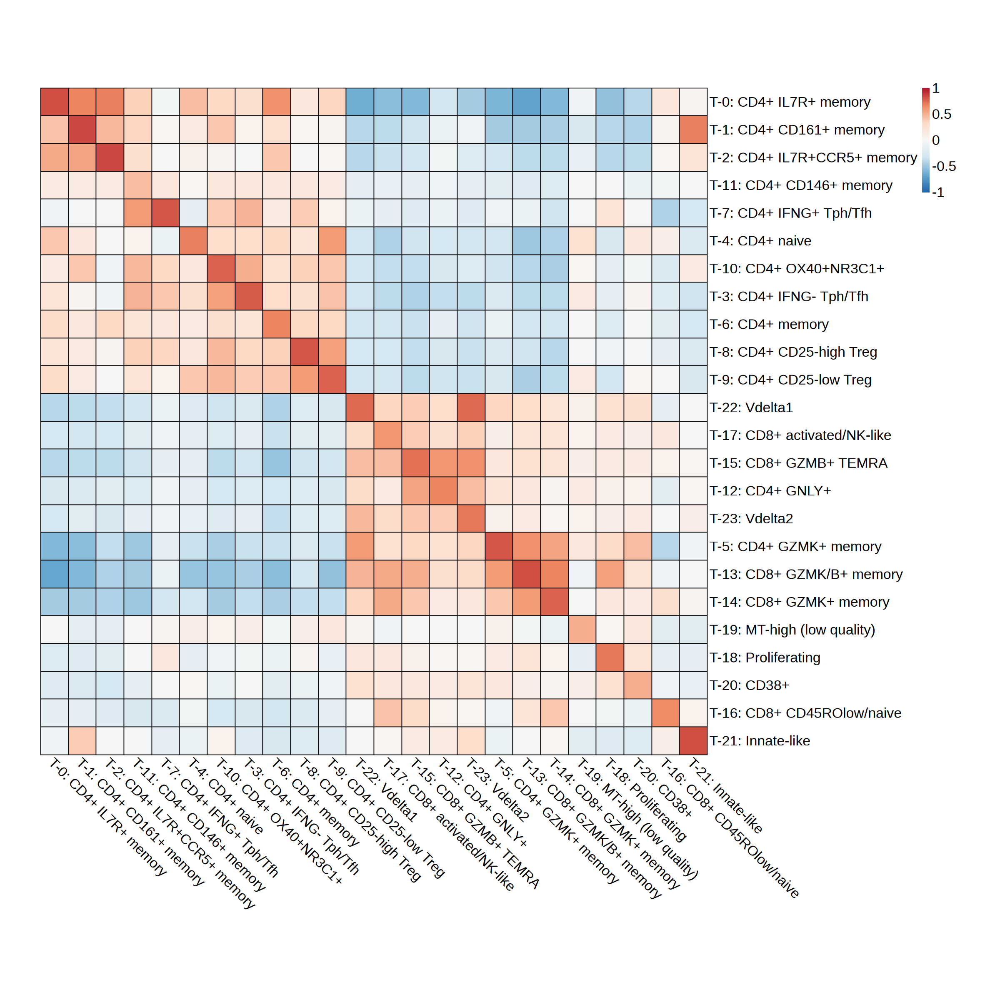

In [12]:
fig.size(20, 20)
pheatmap::pheatmap(correlation, 
                   cluster_rows = F, 
                   cluster_cols = F,
                   border_color = 'black', 
                   #show_rownames = FALSE, 
                   #show_colnames = FALSE, 
                   fontsize = 20, 
                   angle_col = "315", 
                   breaks = seq(-1, 1, length.out = 101), 
                   color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100), 
                   cellwidth = 40,
                   cellheight = 40)

In [83]:
correlation <- cor(ampp2.fc, ampp2.fc)
head(correlation)

,T-0: CD4+ IL7R+ memory,T-1: CD4+ CD161+ memory,T-10: CD4+ OX40+NR3C1+,T-11: CD4+ CD146+ memory,T-12: CD4+ GNLY+,T-13: CD8+ GZMK/B+ memory,T-14: CD8+ GZMK+ memory,T-15: CD8+ GZMB+ TEMRA,T-16: CD8+ CD45ROlow/naive,T-17: CD8+ activated/NK-like,T-18: Proliferating,T-19: MT-high (low quality),T-2: CD4+ IL7R+CCR5+ memory,T-20: CD38+,T-21: Innate-like,T-22: Vdelta1,T-23: Vdelta2,T-3: CD4+ IFNG- Tph/Tfh,T-4: CD4+ naive,T-5: CD4+ GZMK+ memory,T-6: CD4+ memory,T-7: CD4+ IFNG+ Tph/Tfh,T-8: CD4+ CD25-high Treg,T-9: CD4+ CD25-low Treg
T-0: CD4+ IL7R+ memory,1.0000000,0.7278669,0.3998252,0.3417630,-0.4504292,-0.8539289,-0.6661950,-0.6623641,0.3790315,-0.6133714,-0.6493450,0.019999869,0.68089686,-0.3426520,-0.041631780,-0.7741238,-0.6063735,0.3253800,0.72244192,-0.7539619,0.7824545,-0.16819324,0.1953362,0.5594192
T-1: CD4+ CD161+ memory,0.7278669,1.0000000,0.5309406,0.4170193,-0.2898471,-0.7303117,-0.6287232,-0.5490180,0.2274004,-0.5650863,-0.5791694,-0.226823847,0.65048244,-0.4757114,0.510560986,-0.6729073,-0.3484223,0.1868258,0.41115050,-0.7039308,0.5478308,-0.03748133,0.1164112,0.2877358
T-10: CD4+ OX40+NR3C1+,0.3998252,0.5309406,1.0000000,0.7468565,-0.4543188,-0.6530866,-0.7038606,-0.5986166,-0.1954293,-0.5112942,-0.2760449,-0.007057783,0.05085539,-0.2028169,-0.026660357,-0.5456485,-0.4808500,0.8012412,0.30408983,-0.5991472,0.4457842,0.48705064,0.5516181,0.6002262
T-11: CD4+ CD146+ memory,0.3417630,0.4170193,0.7468565,1.0000000,-0.3174377,-0.5407474,-0.6707580,-0.4991917,-0.2432640,-0.3678010,-0.1024711,0.011736928,0.23904144,-0.3118500,-0.049780372,-0.4706348,-0.4088283,0.7225226,0.02655584,-0.5421646,0.3160245,0.74615093,0.5115501,0.3185215
T-12: CD4+ GNLY+,-0.4504292,-0.2898471,-0.4543188,-0.3174377,1.0000000,0.3295886,0.1684549,0.8702820,-0.1237318,0.3073483,0.1784714,-0.095326914,-0.21743967,-0.1261793,0.168591798,0.4043643,0.6471297,-0.4437521,-0.39072535,0.2231662,-0.4907927,-0.09732768,-0.3362155,-0.5023993
T-13: CD8+ GZMK/B+ memory,-0.8539289,-0.7303117,-0.6530866,-0.5407474,0.3295886,1.0000000,0.8194065,0.5647137,-0.2573902,0.6154213,0.6533268,0.029055828,-0.47117561,0.3513715,-0.001074089,0.7129983,0.4787236,-0.5456174,-0.71171207,0.8574648,-0.6953784,-0.07301410,-0.3479236,-0.6775568


In [84]:
#clust_result <- pheatmap::pheatmap(correlation, cluster_rows = TRUE, cluster_cols = FALSE, silent = TRUE)
#row_order <- clust_result$tree_row$order
# Step 2: Apply row clustering to data
correlation <- correlation[row_order, row_order]

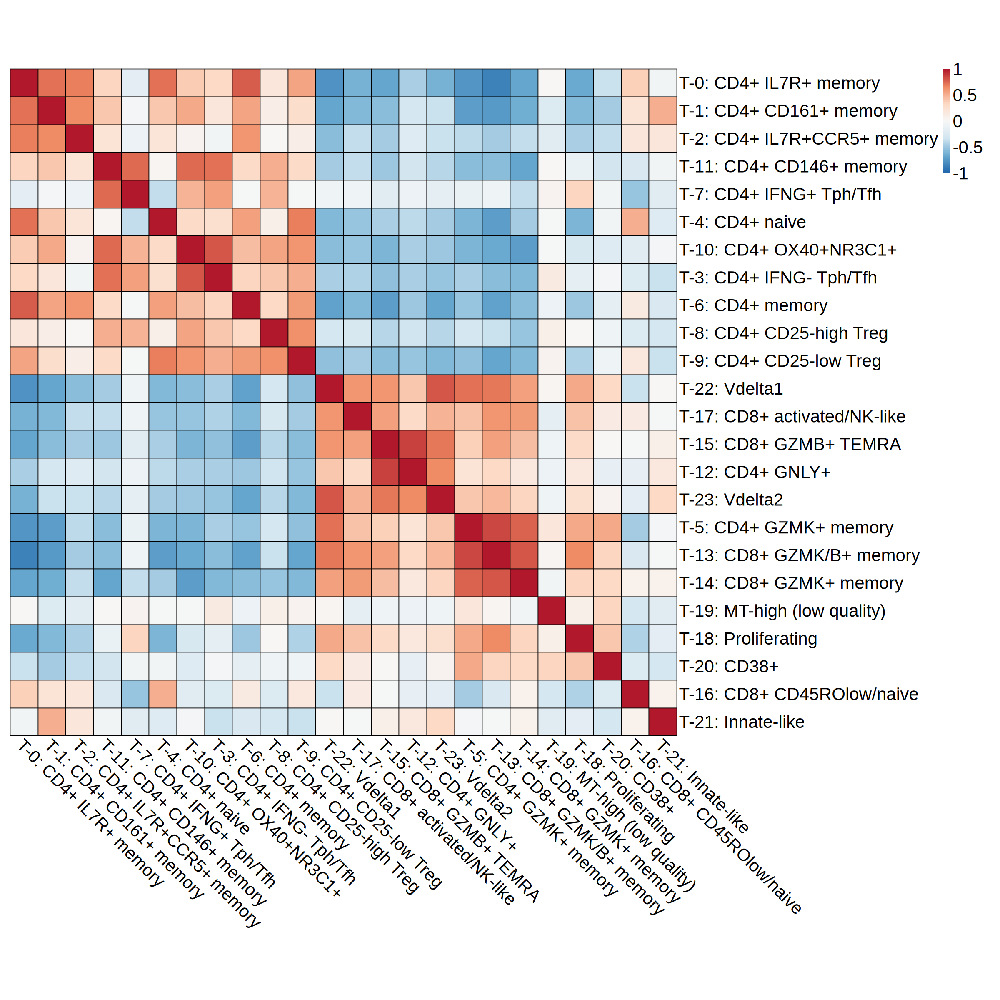

In [88]:
fig.size(20, 20)
pheatmap::pheatmap(correlation, 
                   cluster_rows = F, 
                   cluster_cols = F,
                   border_color = 'black', 
                   fontsize = 25, 
                   angle_col = "315", 
                   #show_rownames = FALSE, 
                   #show_colnames = FALSE, 
                   breaks = seq(-1, 1, length.out = 101), 
                   color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100), 
                   cellwidth = 40,
                   cellheight = 40)

### Example FC correlations between Xenium and AMPp2 

In [94]:
xenium_t3.fc <- xenium.markers %>% 
    dplyr::select(feature, group, logFC) %>% 
    filter(grepl("T-3", group)) %>% 
    dplyr::select(-group) %>% 
    rename(xenium_logFC = logFC)
ampp2_t3.fc <- ampp2.markers %>% 
    dplyr::select(feature, group, logFC) %>% 
    filter(grepl("T-3", group)) %>% 
    dplyr::select(-group) %>% 
    rename(ampp2_logFC = logFC)
#            tidyr::pivot_wider(id_cols = "feature", names_from = "group", values_from = "logFC")%>% 
#            tibble::column_to_rownames("feature")
#names(xenium.fc) <- paste0("xenium_", names(xenium.fc))
#ampp2.fc <- ampp2.markers %>% dplyr::select(feature, group, logFC) %>% 
#            tidyr::pivot_wider(id_cols = "feature", names_from = "group", values_from = "logFC")%>% 
#            tibble::column_to_rownames("feature")
#names(ampp2.fc) <- paste0("ampp2_", names(ampp2.fc))

Warning message:
“Removed 1884 rows containing missing values or values outside the scale range
(`geom_text_repel()`).”


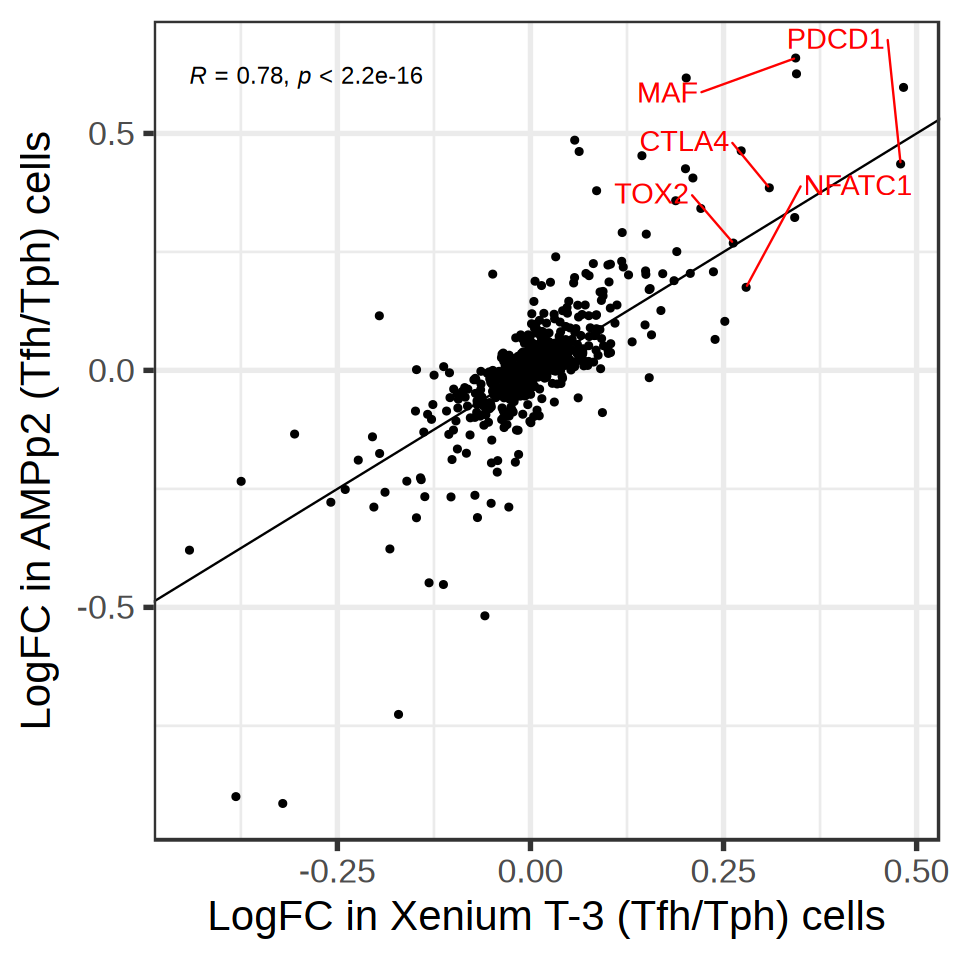

In [180]:
fig.size(8, 8)
plot.fc <- left_join(xenium_t3.fc, ampp2_t3.fc, by = 'feature') %>% 
    mutate(labeled = if_else(feature %in% c("PDCD1", "CTLA4", "NFATC1", "TOX2", "MAF"),
                         feature,
                         NA_character_)
          ) 

ggplot(plot.fc, aes(x = xenium_logFC, y = ampp2_logFC)) + 
    geom_point() + 
    geom_abline() +
    geom_text_repel(
      aes(x = xenium_logFC, y = ampp2_logFC, label = labeled),
      segment.color = 'red',
      color = 'red', 
      size = 6, 
      force = 500
    ) + 
    ggpubr::stat_cor(method = 'pearson', size = 5) +
    labs(x = 'LogFC in Xenium T-3 (Tfh/Tph) cells', 
         y = 'LogFC in AMPp2 (Tfh/Tph) cells')